In [3]:
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
import os
from sklearn.model_selection import cross_val_score

# Preprocessing

In [2]:
data = pd.read_excel("./data/credit/credit.xlsx")
data = data.drop(columns=['ID','SEX', 'EDUCATION', 'MARRIAGE'])

In [6]:
data.shape

(30000, 21)

In [4]:
# data columns will be all other columns except class
data_cols = list(data.columns[ data.columns != 'default payment next month' ])
label_cols = ['default payment next month']

In [7]:
# Standardize columns
data[data_cols] = StandardScaler().fit_transform(data[data_cols])

C:\Programas\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Programas\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [16]:
pd.value_counts(data[label_cols].values.flatten())

0    23364
1     6636
dtype: int64

In [8]:
def xgbo_cv(X,y):
    xg_reg = xgb.XGBClassifier(object="binary:logistic")
    
    print('Accuracy XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='accuracy', n_jobs=-1).mean()))
    print('F1-Score XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring='f1', n_jobs=-1).mean()))
    print('ROC AUC XGBoost CV:  '+ np.str(cross_val_score(xg_reg, X,y, cv=5, scoring = 'roc_auc', n_jobs=-1).mean()))

# GAN setup and training

In [10]:
import CGAN

# For reloading after making changes
import importlib
importlib.reload(CGAN) 
from CGAN import *


rand_dim = 100 
base_n_count = 30 

nb_steps = 50000 + 1 # 50000 # Add one for logging of the last interval
batch_size = 64 

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100   # number of steps to pre-train the critic before starting adversarial training
log_interval = 100 #interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-5 
data_dir = './cache/credit/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True 

train = data.copy().reset_index(drop=True) # fraud only with labels from classification


train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim:  20
data_cols:  ['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
label_dim:  1
label_cols:  ['default payment next month']
Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenat

C:\Programas\Anaconda3\lib\site-packages\keras\engine\training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Instructions for updating:
Use tf.cast instead.
Step: 0 of 50001.
Losses: G, D Gen, D Real: 0.7060, 0.6747, 0.6837
D Real - D Gen: 0.0089


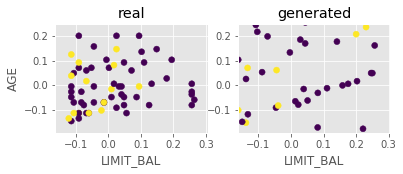

Step: 100 of 50001.
Losses: G, D Gen, D Real: 0.7265, 0.6444, 0.6697
D Real - D Gen: 0.0253


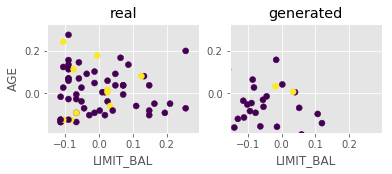

Step: 200 of 50001.
Losses: G, D Gen, D Real: 0.6749, 0.6851, 0.6606
D Real - D Gen: -0.0245


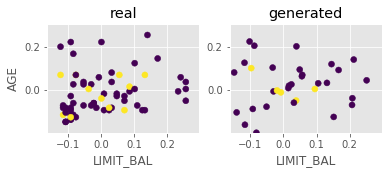

Step: 300 of 50001.
Losses: G, D Gen, D Real: 0.6470, 0.7124, 0.6604
D Real - D Gen: -0.0520


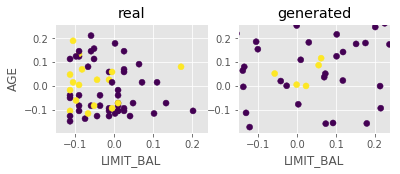

Step: 400 of 50001.
Losses: G, D Gen, D Real: 0.7029, 0.6419, 0.6696
D Real - D Gen: 0.0277


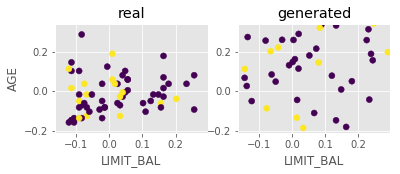

Step: 500 of 50001.
Losses: G, D Gen, D Real: 0.7710, 0.6289, 0.6661
D Real - D Gen: 0.0372


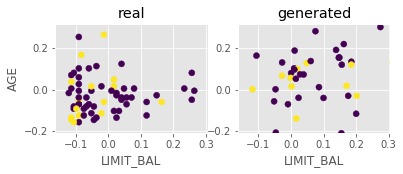

Step: 600 of 50001.
Losses: G, D Gen, D Real: 0.7263, 0.6232, 0.6613
D Real - D Gen: 0.0380


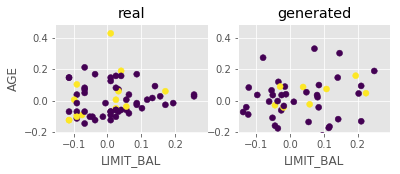

Step: 700 of 50001.
Losses: G, D Gen, D Real: 0.6945, 0.6242, 0.6637
D Real - D Gen: 0.0395


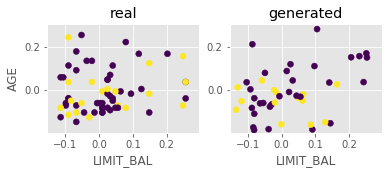

Step: 800 of 50001.
Losses: G, D Gen, D Real: 0.6687, 0.6086, 0.6590
D Real - D Gen: 0.0504


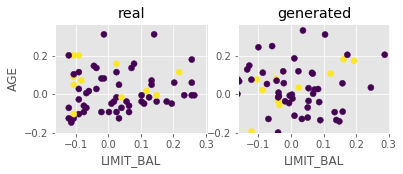

Step: 900 of 50001.
Losses: G, D Gen, D Real: 0.6409, 0.5963, 0.6568
D Real - D Gen: 0.0606


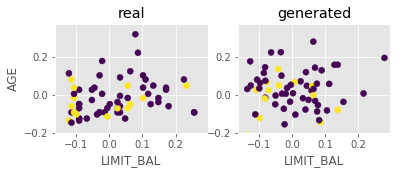

Step: 1000 of 50001.
Losses: G, D Gen, D Real: 0.7152, 0.6126, 0.6347
D Real - D Gen: 0.0221


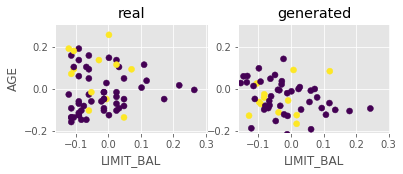

Step: 1100 of 50001.
Losses: G, D Gen, D Real: 0.6507, 0.6090, 0.6447
D Real - D Gen: 0.0357


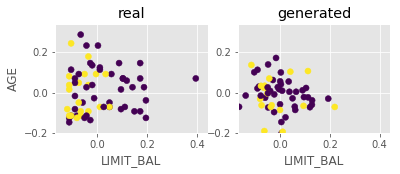

Step: 1200 of 50001.
Losses: G, D Gen, D Real: 0.6053, 0.6066, 0.6441
D Real - D Gen: 0.0375


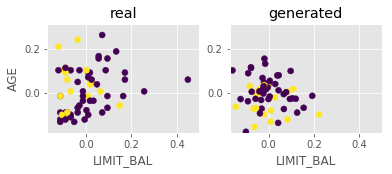

Step: 1300 of 50001.
Losses: G, D Gen, D Real: 0.5658, 0.6069, 0.6469
D Real - D Gen: 0.0400


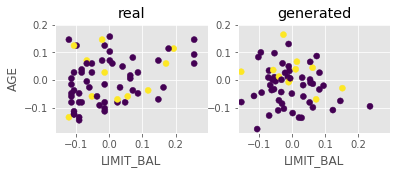

Step: 1400 of 50001.
Losses: G, D Gen, D Real: 0.5492, 0.5956, 0.6313
D Real - D Gen: 0.0358


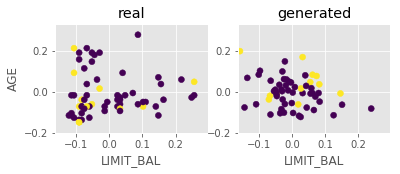

Step: 1500 of 50001.
Losses: G, D Gen, D Real: 0.6630, 0.6443, 0.6393
D Real - D Gen: -0.0050


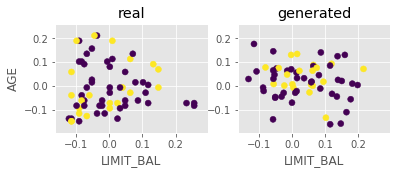

Step: 1600 of 50001.
Losses: G, D Gen, D Real: 0.5930, 0.6323, 0.6284
D Real - D Gen: -0.0039


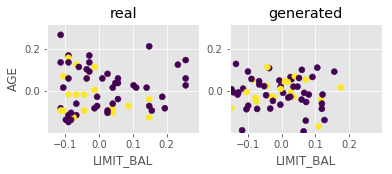

Step: 1700 of 50001.
Losses: G, D Gen, D Real: 0.5613, 0.6329, 0.6554
D Real - D Gen: 0.0226


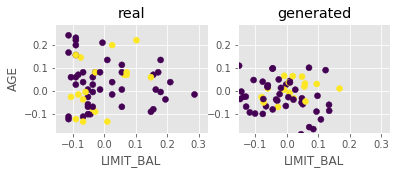

Step: 1800 of 50001.
Losses: G, D Gen, D Real: 0.5363, 0.6193, 0.6165
D Real - D Gen: -0.0027


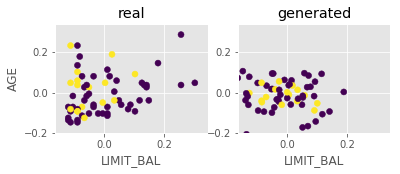

Step: 1900 of 50001.
Losses: G, D Gen, D Real: 0.7042, 0.6262, 0.6219
D Real - D Gen: -0.0043


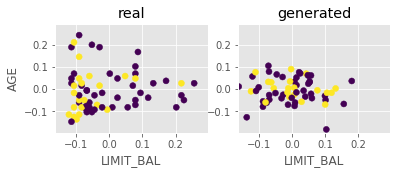

Step: 2000 of 50001.
Losses: G, D Gen, D Real: 0.5865, 0.6415, 0.5989
D Real - D Gen: -0.0425


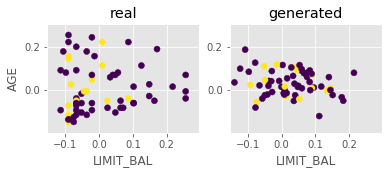

Step: 2100 of 50001.
Losses: G, D Gen, D Real: 0.5448, 0.6349, 0.6303
D Real - D Gen: -0.0046


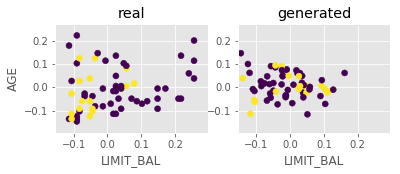

Step: 2200 of 50001.
Losses: G, D Gen, D Real: 0.5173, 0.6275, 0.6108
D Real - D Gen: -0.0167


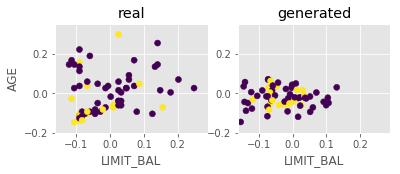

Step: 2300 of 50001.
Losses: G, D Gen, D Real: 0.4878, 0.6082, 0.6174
D Real - D Gen: 0.0092


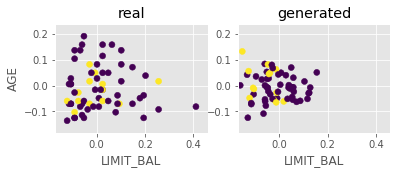

Step: 2400 of 50001.
Losses: G, D Gen, D Real: 0.6217, 0.6906, 0.6428
D Real - D Gen: -0.0478


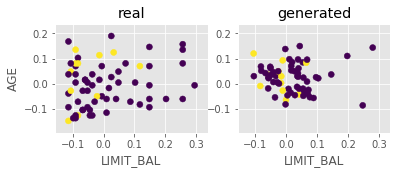

Step: 2500 of 50001.
Losses: G, D Gen, D Real: 0.5452, 0.6691, 0.6030
D Real - D Gen: -0.0661


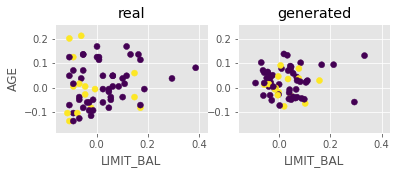

Step: 2600 of 50001.
Losses: G, D Gen, D Real: 0.5227, 0.6522, 0.6397
D Real - D Gen: -0.0125


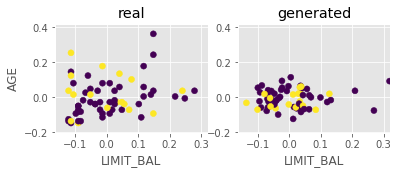

Step: 2700 of 50001.
Losses: G, D Gen, D Real: 0.5062, 0.6275, 0.6133
D Real - D Gen: -0.0142


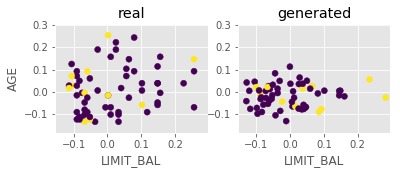

Step: 2800 of 50001.
Losses: G, D Gen, D Real: 0.5247, 0.6329, 0.6426
D Real - D Gen: 0.0097


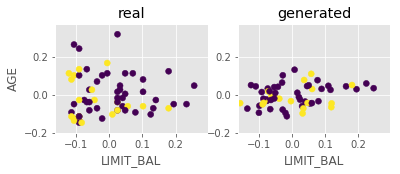

Step: 2900 of 50001.
Losses: G, D Gen, D Real: 0.6210, 0.6410, 0.6272
D Real - D Gen: -0.0138


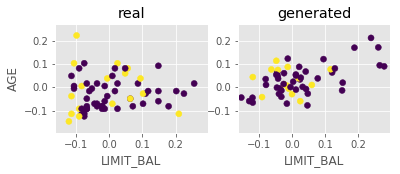

Step: 3000 of 50001.
Losses: G, D Gen, D Real: 0.5222, 0.6245, 0.6239
D Real - D Gen: -0.0006


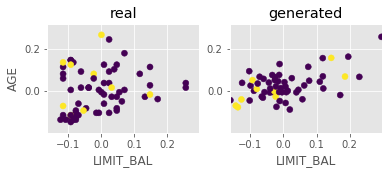

Step: 3100 of 50001.
Losses: G, D Gen, D Real: 0.5124, 0.6268, 0.6304
D Real - D Gen: 0.0036


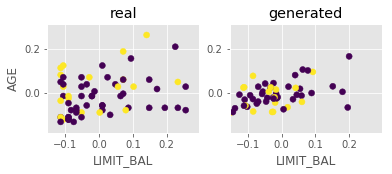

Step: 3200 of 50001.
Losses: G, D Gen, D Real: 0.4909, 0.6179, 0.6679
D Real - D Gen: 0.0500


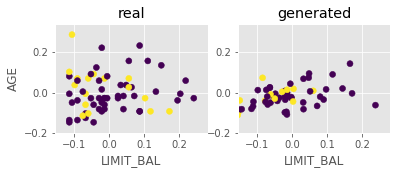

Step: 3300 of 50001.
Losses: G, D Gen, D Real: 0.6822, 0.6291, 0.6310
D Real - D Gen: 0.0019


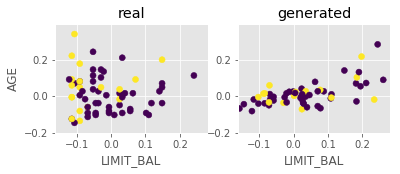

Step: 3400 of 50001.
Losses: G, D Gen, D Real: 0.5244, 0.6309, 0.6497
D Real - D Gen: 0.0188


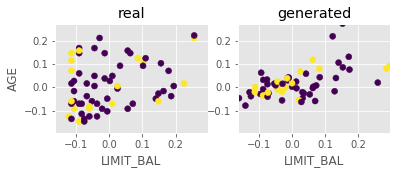

Step: 3500 of 50001.
Losses: G, D Gen, D Real: 0.5105, 0.6244, 0.6095
D Real - D Gen: -0.0149


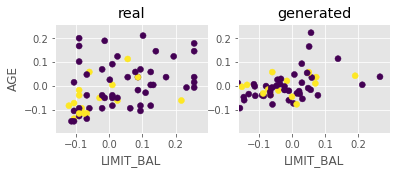

Step: 3600 of 50001.
Losses: G, D Gen, D Real: 0.4734, 0.6171, 0.6459
D Real - D Gen: 0.0287


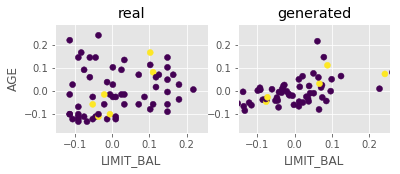

Step: 3700 of 50001.
Losses: G, D Gen, D Real: 0.4895, 0.6194, 0.6252
D Real - D Gen: 0.0058


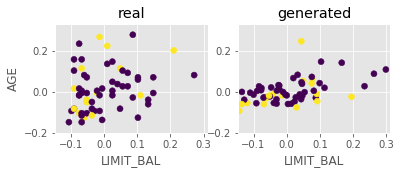

Step: 3800 of 50001.
Losses: G, D Gen, D Real: 0.5974, 0.6486, 0.6757
D Real - D Gen: 0.0270


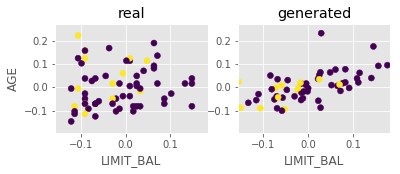

Step: 3900 of 50001.
Losses: G, D Gen, D Real: 0.5394, 0.6483, 0.6627
D Real - D Gen: 0.0144


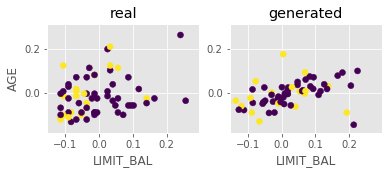

Step: 4000 of 50001.
Losses: G, D Gen, D Real: 0.4878, 0.6367, 0.6235
D Real - D Gen: -0.0132


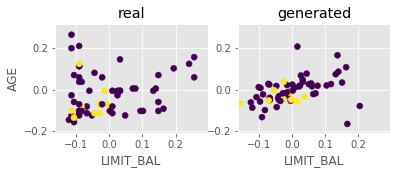

Step: 4100 of 50001.
Losses: G, D Gen, D Real: 0.4912, 0.6291, 0.6667
D Real - D Gen: 0.0376


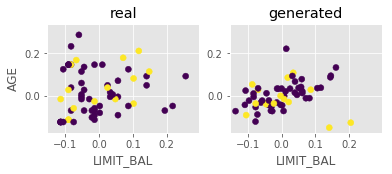

Step: 4200 of 50001.
Losses: G, D Gen, D Real: 0.4681, 0.6403, 0.6047
D Real - D Gen: -0.0356


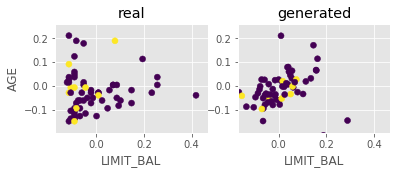

Step: 4300 of 50001.
Losses: G, D Gen, D Real: 0.5810, 0.6685, 0.5984
D Real - D Gen: -0.0702


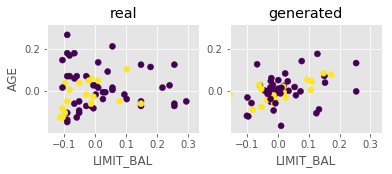

Step: 4400 of 50001.
Losses: G, D Gen, D Real: 0.5429, 0.6536, 0.6277
D Real - D Gen: -0.0259


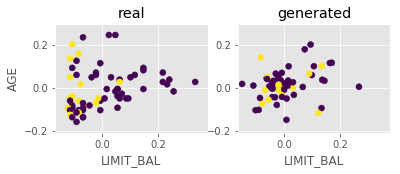

Step: 4500 of 50001.
Losses: G, D Gen, D Real: 0.5073, 0.6440, 0.6388
D Real - D Gen: -0.0051


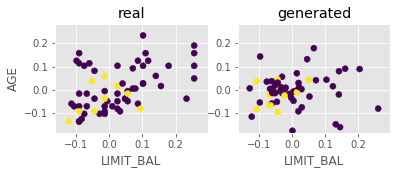

Step: 4600 of 50001.
Losses: G, D Gen, D Real: 0.5215, 0.6382, 0.6372
D Real - D Gen: -0.0010


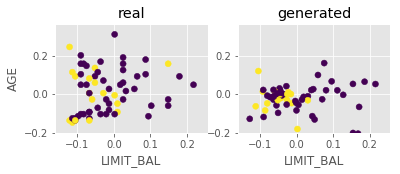

Step: 4700 of 50001.
Losses: G, D Gen, D Real: 0.7206, 0.6585, 0.6148
D Real - D Gen: -0.0437


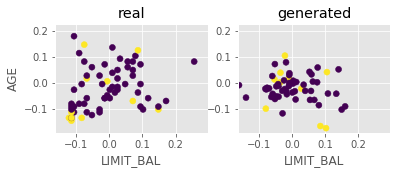

Step: 4800 of 50001.
Losses: G, D Gen, D Real: 0.5836, 0.6635, 0.6419
D Real - D Gen: -0.0216


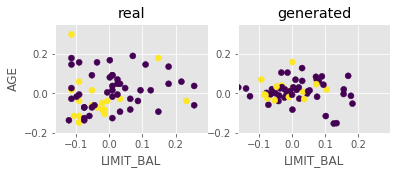

Step: 4900 of 50001.
Losses: G, D Gen, D Real: 0.5470, 0.6342, 0.6534
D Real - D Gen: 0.0192


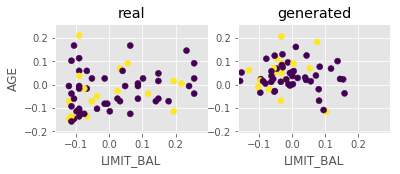

Step: 5000 of 50001.
Losses: G, D Gen, D Real: 0.5245, 0.6257, 0.6627
D Real - D Gen: 0.0369


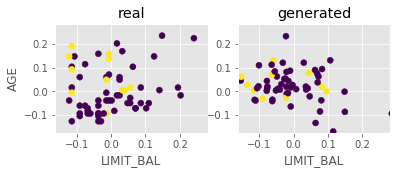

Step: 5100 of 50001.
Losses: G, D Gen, D Real: 0.5306, 0.6187, 0.6532
D Real - D Gen: 0.0344


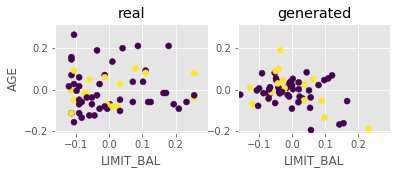

Step: 5200 of 50001.
Losses: G, D Gen, D Real: 0.6706, 0.6581, 0.6289
D Real - D Gen: -0.0292


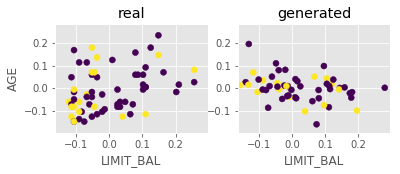

Step: 5300 of 50001.
Losses: G, D Gen, D Real: 0.5748, 0.6186, 0.6147
D Real - D Gen: -0.0038


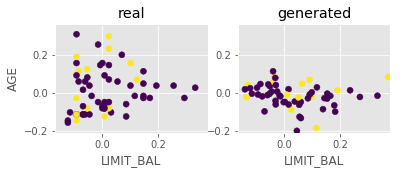

Step: 5400 of 50001.
Losses: G, D Gen, D Real: 0.5504, 0.5943, 0.6579
D Real - D Gen: 0.0636


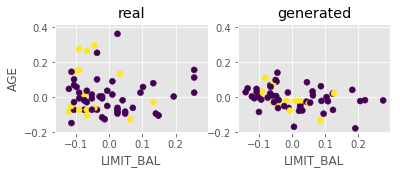

Step: 5500 of 50001.
Losses: G, D Gen, D Real: 0.5155, 0.5918, 0.6630
D Real - D Gen: 0.0713


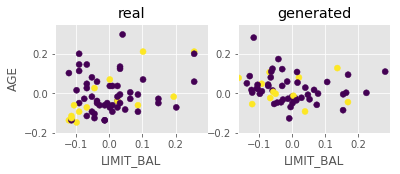

Step: 5600 of 50001.
Losses: G, D Gen, D Real: 0.4873, 0.5845, 0.5903
D Real - D Gen: 0.0058


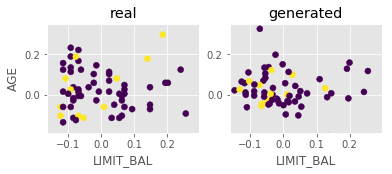

Step: 5700 of 50001.
Losses: G, D Gen, D Real: 0.5959, 0.6744, 0.6315
D Real - D Gen: -0.0429


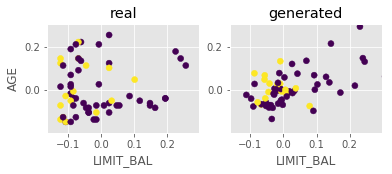

Step: 5800 of 50001.
Losses: G, D Gen, D Real: 0.5448, 0.6424, 0.6202
D Real - D Gen: -0.0222


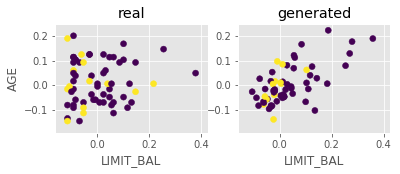

Step: 5900 of 50001.
Losses: G, D Gen, D Real: 0.5271, 0.6300, 0.6404
D Real - D Gen: 0.0104


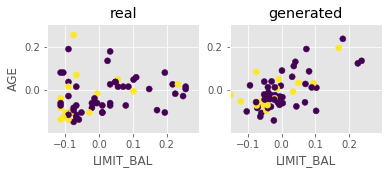

Step: 6000 of 50001.
Losses: G, D Gen, D Real: 0.5033, 0.6229, 0.6430
D Real - D Gen: 0.0202


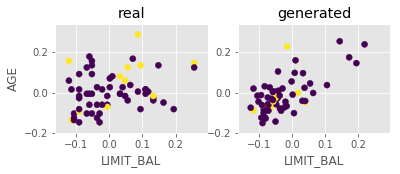

Step: 6100 of 50001.
Losses: G, D Gen, D Real: 0.7306, 0.6489, 0.6367
D Real - D Gen: -0.0122


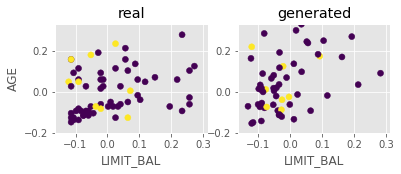

Step: 6200 of 50001.
Losses: G, D Gen, D Real: 0.5540, 0.6761, 0.6290
D Real - D Gen: -0.0471


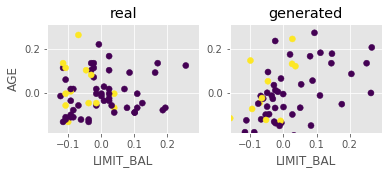

Step: 6300 of 50001.
Losses: G, D Gen, D Real: 0.4947, 0.6561, 0.6333
D Real - D Gen: -0.0228


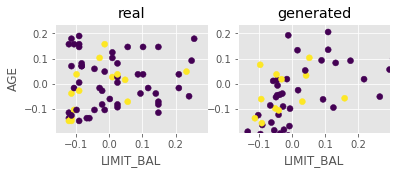

Step: 6400 of 50001.
Losses: G, D Gen, D Real: 0.4993, 0.6579, 0.6171
D Real - D Gen: -0.0409


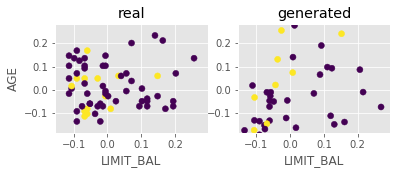

Step: 6500 of 50001.
Losses: G, D Gen, D Real: 0.5161, 0.6078, 0.6704
D Real - D Gen: 0.0626


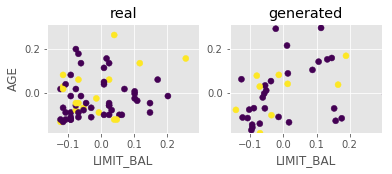

Step: 6600 of 50001.
Losses: G, D Gen, D Real: 0.6728, 0.6537, 0.6153
D Real - D Gen: -0.0384


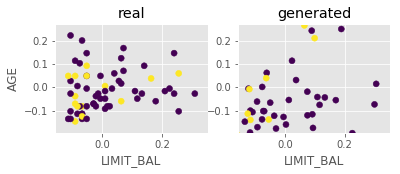

Step: 6700 of 50001.
Losses: G, D Gen, D Real: 0.5718, 0.6714, 0.6243
D Real - D Gen: -0.0471


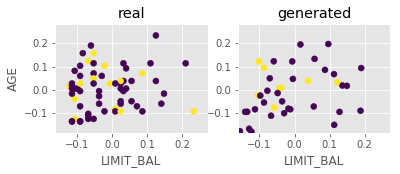

Step: 6800 of 50001.
Losses: G, D Gen, D Real: 0.5440, 0.6320, 0.6239
D Real - D Gen: -0.0081


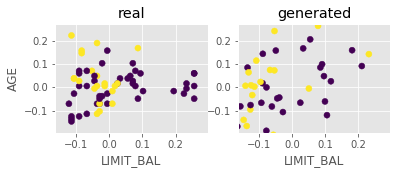

Step: 6900 of 50001.
Losses: G, D Gen, D Real: 0.5063, 0.6260, 0.6072
D Real - D Gen: -0.0187


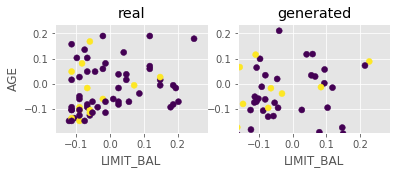

Step: 7000 of 50001.
Losses: G, D Gen, D Real: 0.4633, 0.6394, 0.6321
D Real - D Gen: -0.0073


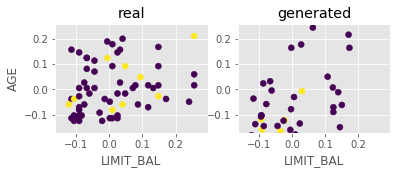

Step: 7100 of 50001.
Losses: G, D Gen, D Real: 0.5597, 0.6780, 0.5929
D Real - D Gen: -0.0851


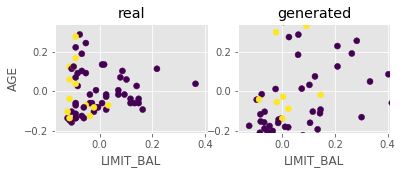

Step: 7200 of 50001.
Losses: G, D Gen, D Real: 0.5674, 0.6302, 0.6164
D Real - D Gen: -0.0138


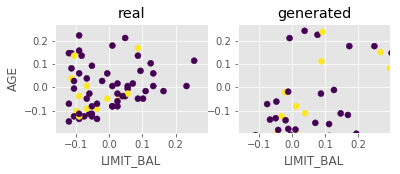

Step: 7300 of 50001.
Losses: G, D Gen, D Real: 0.5580, 0.6017, 0.6017
D Real - D Gen: 0.0001


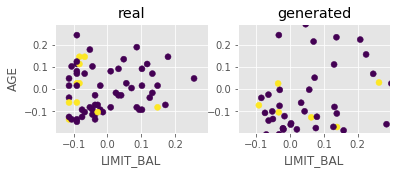

Step: 7400 of 50001.
Losses: G, D Gen, D Real: 0.5168, 0.6343, 0.5701
D Real - D Gen: -0.0642


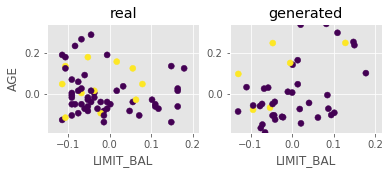

Step: 7500 of 50001.
Losses: G, D Gen, D Real: 0.8166, 0.5958, 0.6408
D Real - D Gen: 0.0450


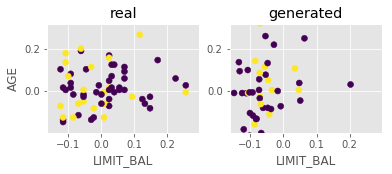

Step: 7600 of 50001.
Losses: G, D Gen, D Real: 0.6145, 0.6006, 0.6229
D Real - D Gen: 0.0223


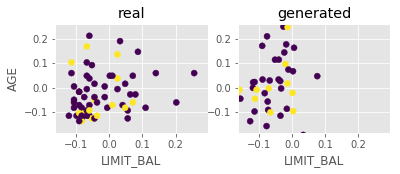

Step: 7700 of 50001.
Losses: G, D Gen, D Real: 0.5566, 0.5859, 0.6380
D Real - D Gen: 0.0522


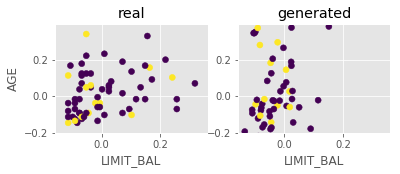

Step: 7800 of 50001.
Losses: G, D Gen, D Real: 0.4940, 0.6040, 0.6572
D Real - D Gen: 0.0532


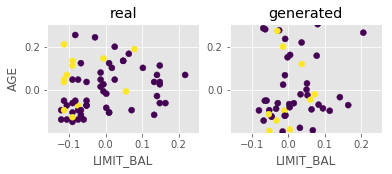

Step: 7900 of 50001.
Losses: G, D Gen, D Real: 0.4830, 0.5885, 0.6101
D Real - D Gen: 0.0216


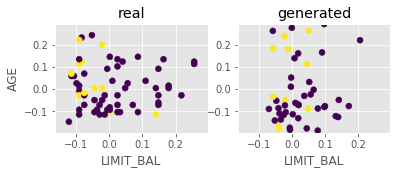

Step: 8000 of 50001.
Losses: G, D Gen, D Real: 0.6799, 0.6191, 0.5829
D Real - D Gen: -0.0363


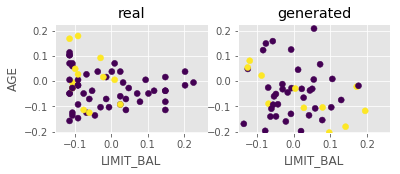

Step: 8100 of 50001.
Losses: G, D Gen, D Real: 0.5457, 0.6069, 0.5855
D Real - D Gen: -0.0214


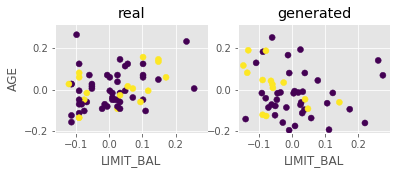

Step: 8200 of 50001.
Losses: G, D Gen, D Real: 0.4802, 0.6112, 0.6645
D Real - D Gen: 0.0532


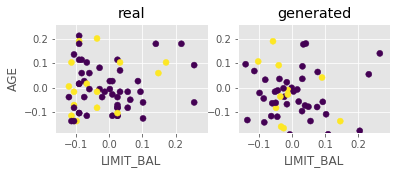

Step: 8300 of 50001.
Losses: G, D Gen, D Real: 0.4454, 0.6049, 0.6850
D Real - D Gen: 0.0802


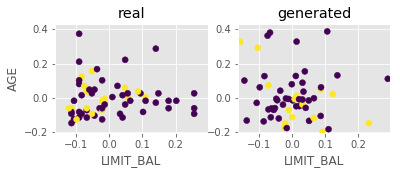

Step: 8400 of 50001.
Losses: G, D Gen, D Real: 0.4066, 0.5851, 0.6724
D Real - D Gen: 0.0873


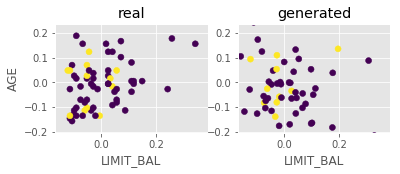

Step: 8500 of 50001.
Losses: G, D Gen, D Real: 0.6902, 0.5957, 0.6780
D Real - D Gen: 0.0823


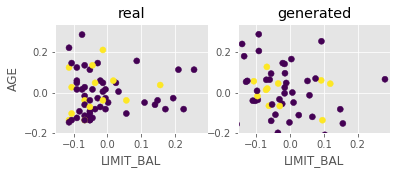

Step: 8600 of 50001.
Losses: G, D Gen, D Real: 0.5758, 0.6218, 0.6814
D Real - D Gen: 0.0596


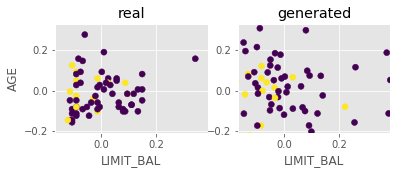

Step: 8700 of 50001.
Losses: G, D Gen, D Real: 0.5303, 0.6124, 0.6015
D Real - D Gen: -0.0109


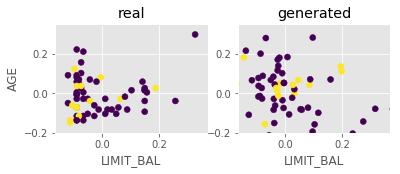

Step: 8800 of 50001.
Losses: G, D Gen, D Real: 0.5052, 0.6136, 0.6348
D Real - D Gen: 0.0211


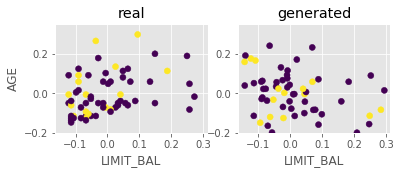

Step: 8900 of 50001.
Losses: G, D Gen, D Real: 0.4713, 0.6219, 0.6444
D Real - D Gen: 0.0226


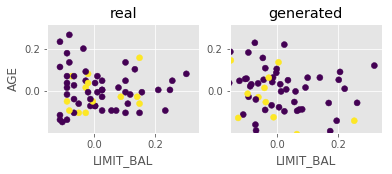

Step: 9000 of 50001.
Losses: G, D Gen, D Real: 0.5710, 0.6361, 0.6096
D Real - D Gen: -0.0265


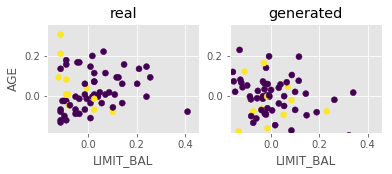

Step: 9100 of 50001.
Losses: G, D Gen, D Real: 0.5488, 0.6207, 0.6532
D Real - D Gen: 0.0325


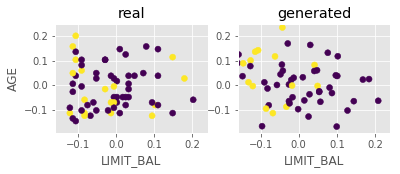

Step: 9200 of 50001.
Losses: G, D Gen, D Real: 0.5160, 0.6161, 0.6369
D Real - D Gen: 0.0208


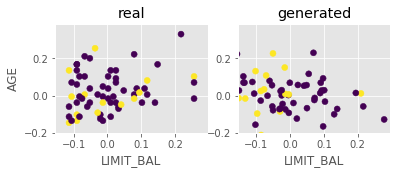

Step: 9300 of 50001.
Losses: G, D Gen, D Real: 0.5116, 0.6107, 0.6514
D Real - D Gen: 0.0408


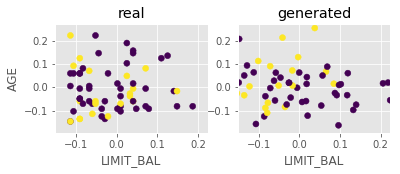

Step: 9400 of 50001.
Losses: G, D Gen, D Real: 0.7347, 0.6292, 0.6671
D Real - D Gen: 0.0378


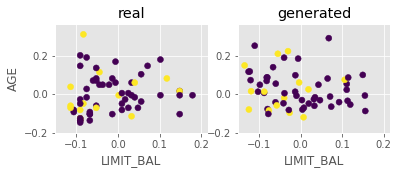

Step: 9500 of 50001.
Losses: G, D Gen, D Real: 0.5962, 0.6136, 0.6210
D Real - D Gen: 0.0074


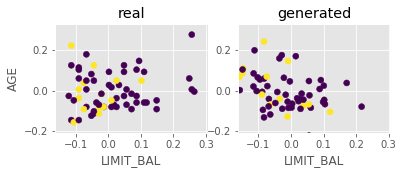

Step: 9600 of 50001.
Losses: G, D Gen, D Real: 0.5449, 0.6152, 0.6655
D Real - D Gen: 0.0503


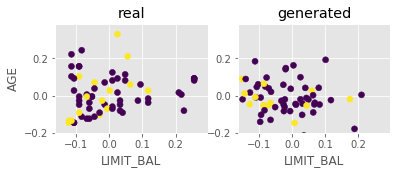

Step: 9700 of 50001.
Losses: G, D Gen, D Real: 0.5211, 0.6028, 0.6023
D Real - D Gen: -0.0005


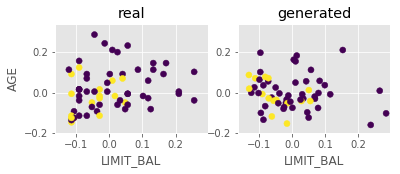

Step: 9800 of 50001.
Losses: G, D Gen, D Real: 0.5012, 0.5953, 0.6099
D Real - D Gen: 0.0145


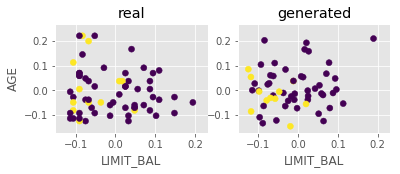

Step: 9900 of 50001.
Losses: G, D Gen, D Real: 0.6338, 0.6429, 0.6147
D Real - D Gen: -0.0282


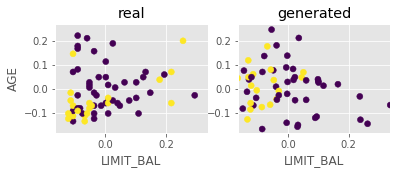

Step: 10000 of 50001.
Losses: G, D Gen, D Real: 0.5330, 0.6075, 0.6611
D Real - D Gen: 0.0537


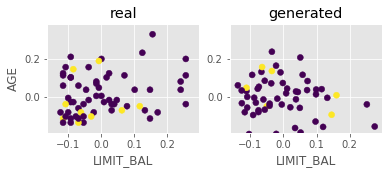

Step: 10100 of 50001.
Losses: G, D Gen, D Real: 0.5109, 0.6090, 0.6323
D Real - D Gen: 0.0233


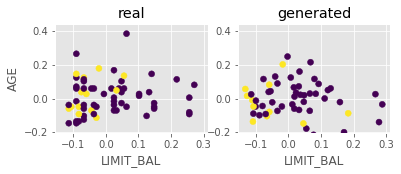

Step: 10200 of 50001.
Losses: G, D Gen, D Real: 0.4691, 0.5907, 0.6248
D Real - D Gen: 0.0341


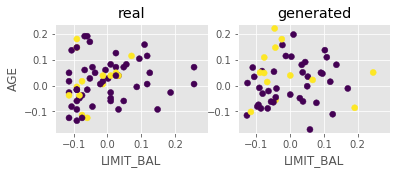

Step: 10300 of 50001.
Losses: G, D Gen, D Real: 0.4366, 0.5897, 0.6161
D Real - D Gen: 0.0264


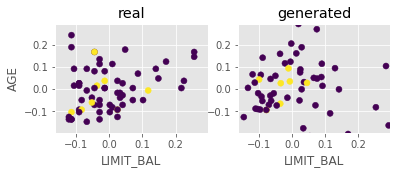

Step: 10400 of 50001.
Losses: G, D Gen, D Real: 0.5571, 0.6305, 0.5650
D Real - D Gen: -0.0655


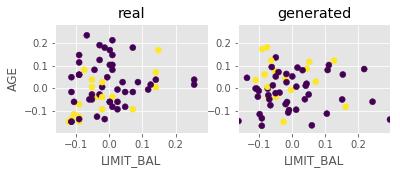

Step: 10500 of 50001.
Losses: G, D Gen, D Real: 0.4959, 0.6004, 0.6132
D Real - D Gen: 0.0128


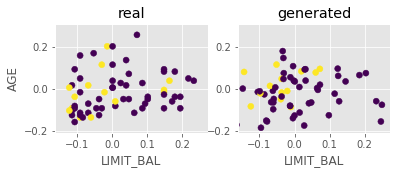

Step: 10600 of 50001.
Losses: G, D Gen, D Real: 0.4557, 0.6314, 0.7127
D Real - D Gen: 0.0813


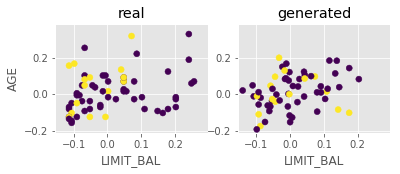

Step: 10700 of 50001.
Losses: G, D Gen, D Real: 0.4109, 0.6270, 0.6262
D Real - D Gen: -0.0008


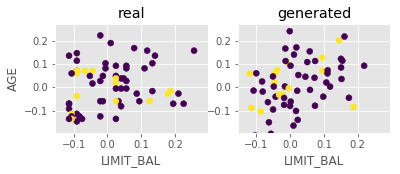

Step: 10800 of 50001.
Losses: G, D Gen, D Real: 0.7658, 0.5575, 0.6158
D Real - D Gen: 0.0583


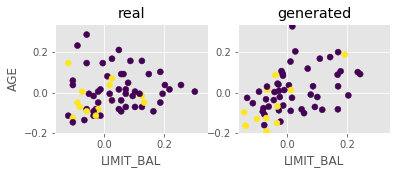

Step: 10900 of 50001.
Losses: G, D Gen, D Real: 0.5268, 0.5611, 0.6210
D Real - D Gen: 0.0598


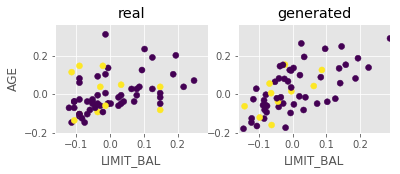

Step: 11000 of 50001.
Losses: G, D Gen, D Real: 0.4681, 0.5771, 0.6726
D Real - D Gen: 0.0956


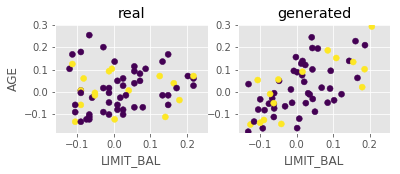

Step: 11100 of 50001.
Losses: G, D Gen, D Real: 0.4494, 0.5810, 0.6370
D Real - D Gen: 0.0560


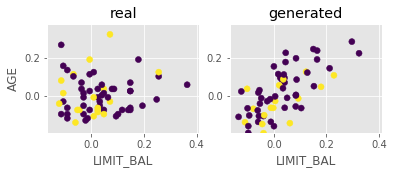

Step: 11200 of 50001.
Losses: G, D Gen, D Real: 0.3977, 0.5705, 0.5565
D Real - D Gen: -0.0140


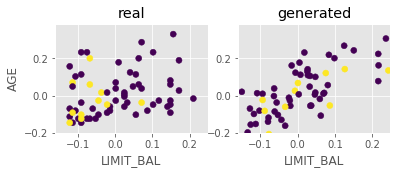

Step: 11300 of 50001.
Losses: G, D Gen, D Real: 0.5649, 0.6325, 0.5967
D Real - D Gen: -0.0359


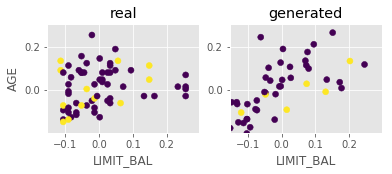

Step: 11400 of 50001.
Losses: G, D Gen, D Real: 0.5029, 0.6099, 0.6349
D Real - D Gen: 0.0250


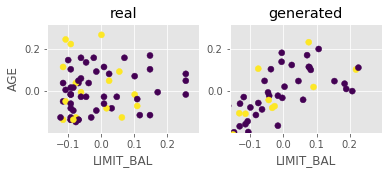

Step: 11500 of 50001.
Losses: G, D Gen, D Real: 0.4577, 0.5746, 0.5472
D Real - D Gen: -0.0274


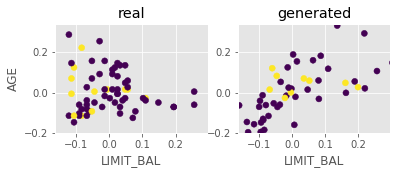

Step: 11600 of 50001.
Losses: G, D Gen, D Real: 0.4187, 0.5536, 0.5436
D Real - D Gen: -0.0100


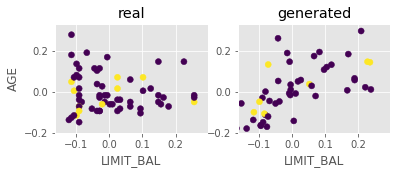

Step: 11700 of 50001.
Losses: G, D Gen, D Real: 0.3956, 0.5443, 0.5452
D Real - D Gen: 0.0009


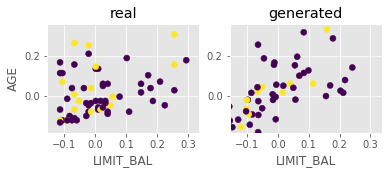

Step: 11800 of 50001.
Losses: G, D Gen, D Real: 0.5657, 0.5791, 0.6066
D Real - D Gen: 0.0275


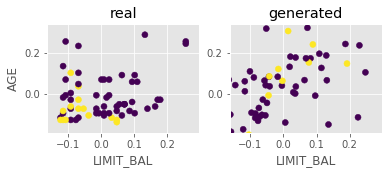

Step: 11900 of 50001.
Losses: G, D Gen, D Real: 0.4900, 0.6005, 0.5807
D Real - D Gen: -0.0198


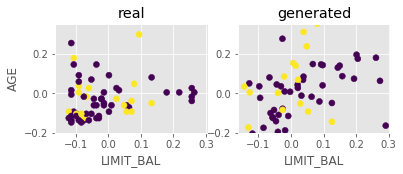

Step: 12000 of 50001.
Losses: G, D Gen, D Real: 0.4534, 0.5731, 0.5544
D Real - D Gen: -0.0187


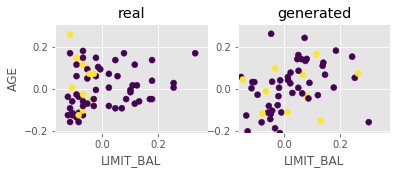

Step: 12100 of 50001.
Losses: G, D Gen, D Real: 0.4495, 0.5878, 0.6580
D Real - D Gen: 0.0702


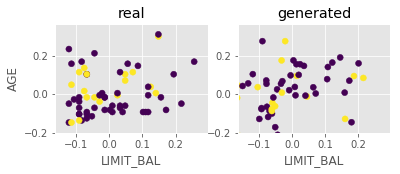

Step: 12200 of 50001.
Losses: G, D Gen, D Real: 0.7595, 0.5863, 0.5758
D Real - D Gen: -0.0105


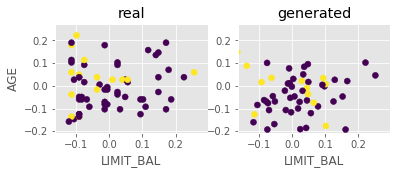

Step: 12300 of 50001.
Losses: G, D Gen, D Real: 0.5440, 0.5848, 0.6004
D Real - D Gen: 0.0156


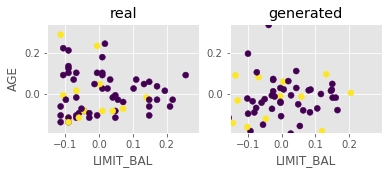

Step: 12400 of 50001.
Losses: G, D Gen, D Real: 0.4871, 0.5690, 0.5818
D Real - D Gen: 0.0128


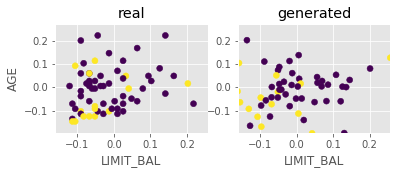

Step: 12500 of 50001.
Losses: G, D Gen, D Real: 0.4618, 0.5701, 0.5396
D Real - D Gen: -0.0306


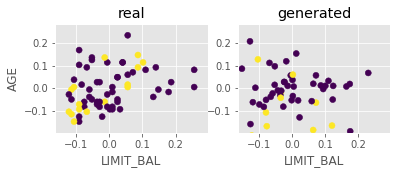

Step: 12600 of 50001.
Losses: G, D Gen, D Real: 0.4298, 0.5507, 0.5898
D Real - D Gen: 0.0391


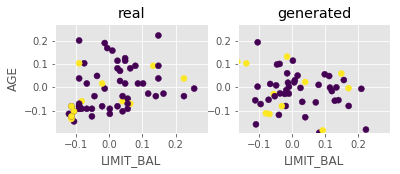

Step: 12700 of 50001.
Losses: G, D Gen, D Real: 0.6631, 0.6252, 0.5621
D Real - D Gen: -0.0631


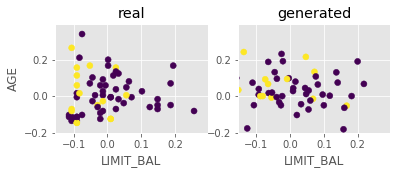

Step: 12800 of 50001.
Losses: G, D Gen, D Real: 0.5157, 0.5952, 0.6314
D Real - D Gen: 0.0362


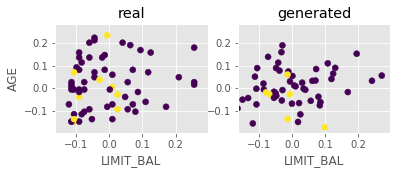

Step: 12900 of 50001.
Losses: G, D Gen, D Real: 0.4900, 0.5838, 0.6099
D Real - D Gen: 0.0261


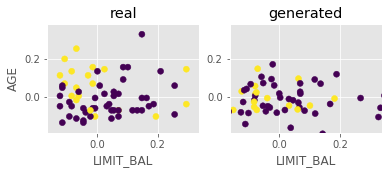

Step: 13000 of 50001.
Losses: G, D Gen, D Real: 0.4411, 0.5756, 0.5854
D Real - D Gen: 0.0098


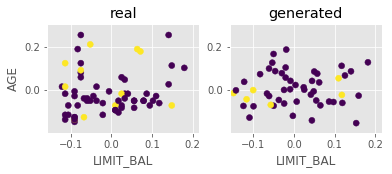

Step: 13100 of 50001.
Losses: G, D Gen, D Real: 0.4517, 0.5768, 0.5673
D Real - D Gen: -0.0096


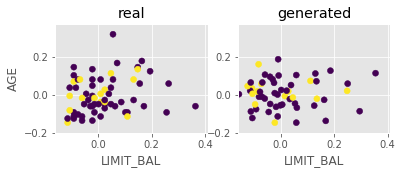

Step: 13200 of 50001.
Losses: G, D Gen, D Real: 0.5883, 0.6215, 0.6167
D Real - D Gen: -0.0048


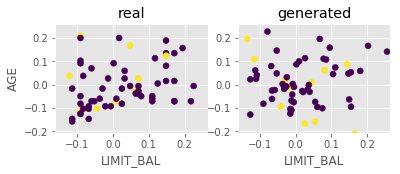

Step: 13300 of 50001.
Losses: G, D Gen, D Real: 0.5106, 0.5796, 0.6042
D Real - D Gen: 0.0246


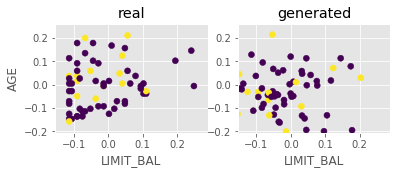

Step: 13400 of 50001.
Losses: G, D Gen, D Real: 0.5092, 0.5785, 0.5643
D Real - D Gen: -0.0142


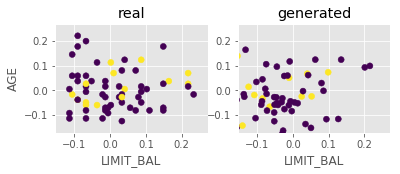

Step: 13500 of 50001.
Losses: G, D Gen, D Real: 0.4768, 0.5876, 0.6206
D Real - D Gen: 0.0330


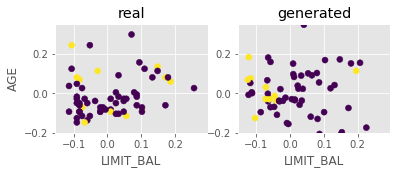

Step: 13600 of 50001.
Losses: G, D Gen, D Real: 0.7818, 0.6453, 0.5883
D Real - D Gen: -0.0570


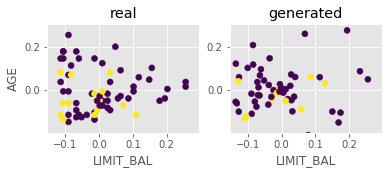

Step: 13700 of 50001.
Losses: G, D Gen, D Real: 0.5755, 0.6101, 0.6029
D Real - D Gen: -0.0072


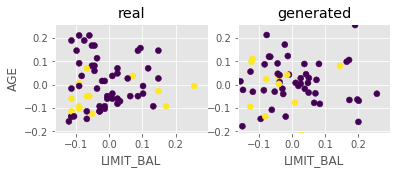

Step: 13800 of 50001.
Losses: G, D Gen, D Real: 0.5393, 0.5949, 0.5888
D Real - D Gen: -0.0061


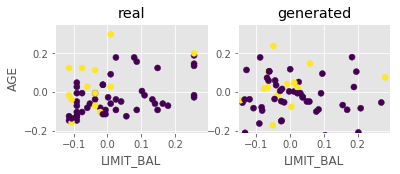

Step: 13900 of 50001.
Losses: G, D Gen, D Real: 0.4822, 0.5815, 0.6154
D Real - D Gen: 0.0339


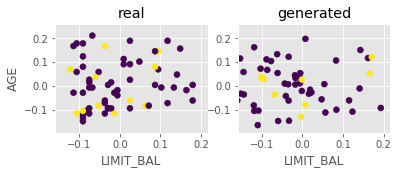

Step: 14000 of 50001.
Losses: G, D Gen, D Real: 0.4694, 0.5771, 0.5915
D Real - D Gen: 0.0144


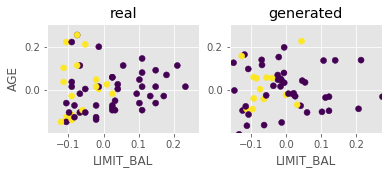

Step: 14100 of 50001.
Losses: G, D Gen, D Real: 0.6550, 0.6753, 0.5851
D Real - D Gen: -0.0902


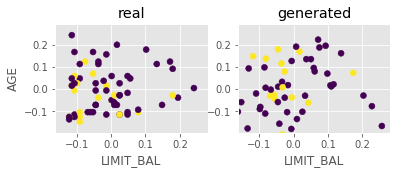

Step: 14200 of 50001.
Losses: G, D Gen, D Real: 0.5840, 0.6199, 0.6469
D Real - D Gen: 0.0270


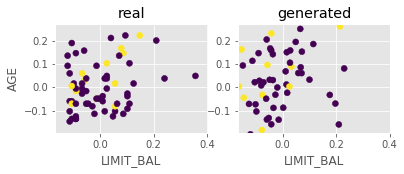

Step: 14300 of 50001.
Losses: G, D Gen, D Real: 0.5351, 0.6083, 0.6311
D Real - D Gen: 0.0228


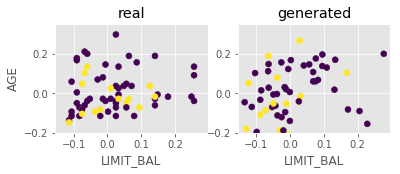

Step: 14400 of 50001.
Losses: G, D Gen, D Real: 0.4957, 0.5708, 0.6408
D Real - D Gen: 0.0700


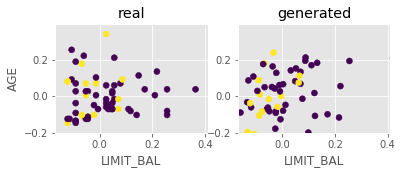

Step: 14500 of 50001.
Losses: G, D Gen, D Real: 0.4283, 0.5919, 0.5890
D Real - D Gen: -0.0029


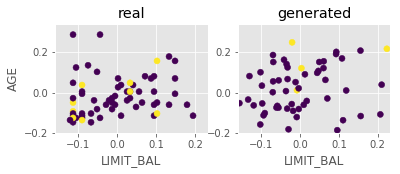

Step: 14600 of 50001.
Losses: G, D Gen, D Real: 0.5847, 0.6004, 0.6132
D Real - D Gen: 0.0128


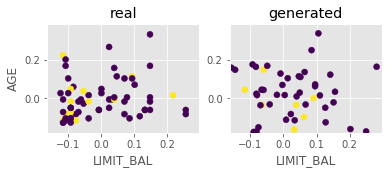

Step: 14700 of 50001.
Losses: G, D Gen, D Real: 0.5094, 0.5841, 0.6526
D Real - D Gen: 0.0685


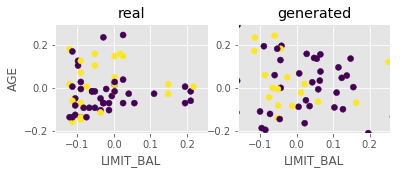

Step: 14800 of 50001.
Losses: G, D Gen, D Real: 0.4573, 0.5999, 0.6487
D Real - D Gen: 0.0488


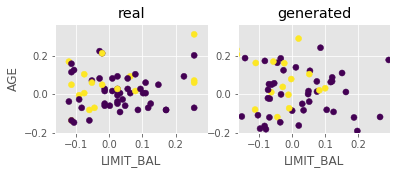

Step: 14900 of 50001.
Losses: G, D Gen, D Real: 0.4072, 0.5571, 0.5724
D Real - D Gen: 0.0153


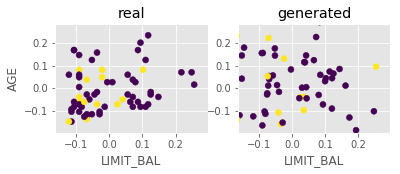

Step: 15000 of 50001.
Losses: G, D Gen, D Real: 0.8555, 0.5951, 0.5801
D Real - D Gen: -0.0150


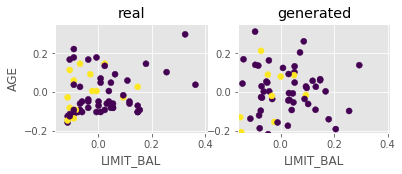

Step: 15100 of 50001.
Losses: G, D Gen, D Real: 0.5234, 0.6525, 0.5287
D Real - D Gen: -0.1237


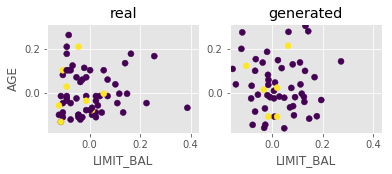

Step: 15200 of 50001.
Losses: G, D Gen, D Real: 0.4401, 0.6340, 0.5974
D Real - D Gen: -0.0366


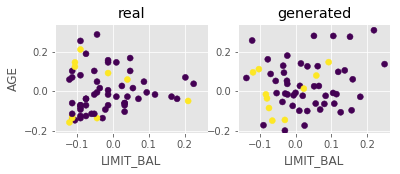

Step: 15300 of 50001.
Losses: G, D Gen, D Real: 0.4228, 0.6264, 0.6020
D Real - D Gen: -0.0245


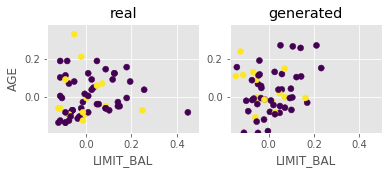

Step: 15400 of 50001.
Losses: G, D Gen, D Real: 0.4065, 0.5963, 0.5901
D Real - D Gen: -0.0062


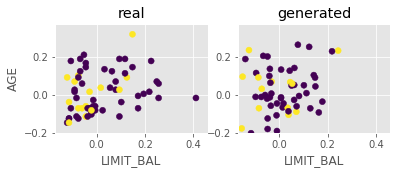

Step: 15500 of 50001.
Losses: G, D Gen, D Real: 0.6587, 0.6592, 0.5937
D Real - D Gen: -0.0656


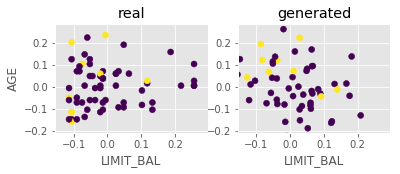

Step: 15600 of 50001.
Losses: G, D Gen, D Real: 0.4994, 0.6300, 0.5904
D Real - D Gen: -0.0396


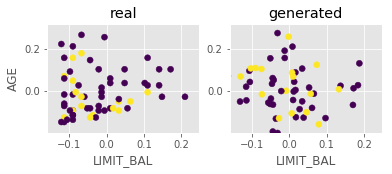

Step: 15700 of 50001.
Losses: G, D Gen, D Real: 0.4306, 0.6083, 0.6369
D Real - D Gen: 0.0286


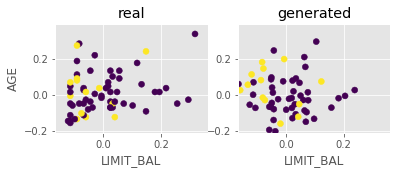

Step: 15800 of 50001.
Losses: G, D Gen, D Real: 0.4239, 0.5922, 0.5721
D Real - D Gen: -0.0201


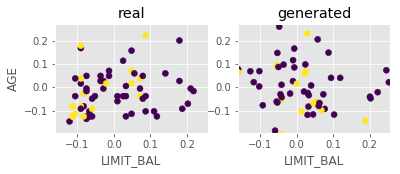

Step: 15900 of 50001.
Losses: G, D Gen, D Real: 0.4014, 0.5669, 0.5939
D Real - D Gen: 0.0270


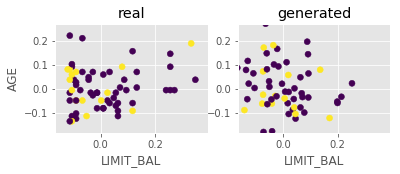

Step: 16000 of 50001.
Losses: G, D Gen, D Real: 0.6297, 0.6011, 0.5757
D Real - D Gen: -0.0253


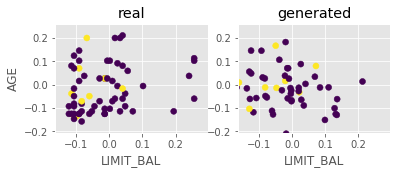

Step: 16100 of 50001.
Losses: G, D Gen, D Real: 0.5174, 0.5810, 0.6156
D Real - D Gen: 0.0346


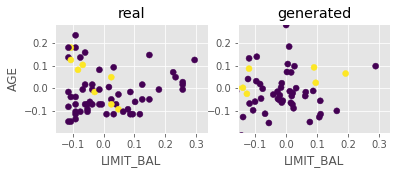

Step: 16200 of 50001.
Losses: G, D Gen, D Real: 0.4659, 0.5835, 0.5194
D Real - D Gen: -0.0640


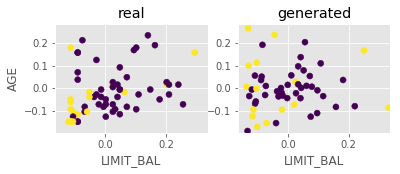

Step: 16300 of 50001.
Losses: G, D Gen, D Real: 0.4387, 0.5770, 0.6005
D Real - D Gen: 0.0235


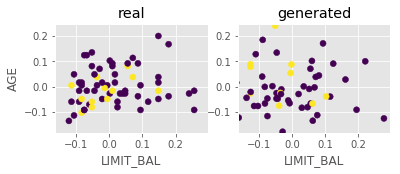

Step: 16400 of 50001.
Losses: G, D Gen, D Real: 0.4210, 0.5753, 0.5920
D Real - D Gen: 0.0167


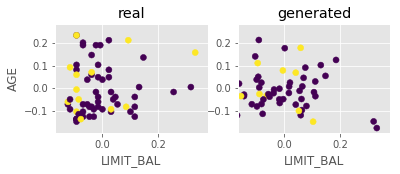

Step: 16500 of 50001.
Losses: G, D Gen, D Real: 0.5908, 0.5863, 0.5931
D Real - D Gen: 0.0067


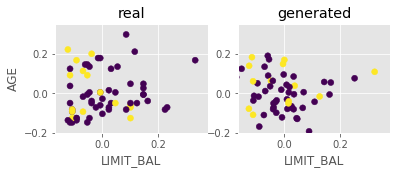

Step: 16600 of 50001.
Losses: G, D Gen, D Real: 0.5205, 0.5910, 0.5831
D Real - D Gen: -0.0079


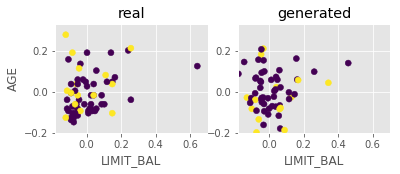

Step: 16700 of 50001.
Losses: G, D Gen, D Real: 0.4952, 0.5765, 0.5854
D Real - D Gen: 0.0089


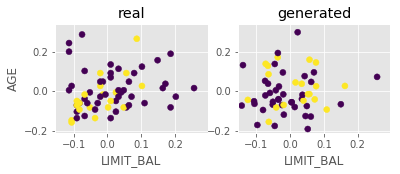

Step: 16800 of 50001.
Losses: G, D Gen, D Real: 0.4457, 0.5615, 0.6594
D Real - D Gen: 0.0979


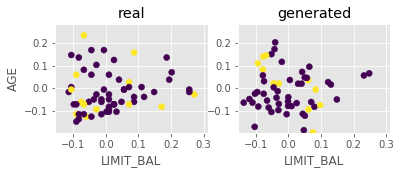

Step: 16900 of 50001.
Losses: G, D Gen, D Real: 0.7682, 0.6254, 0.5902
D Real - D Gen: -0.0352


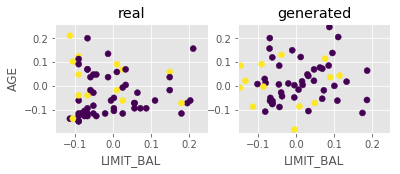

Step: 17000 of 50001.
Losses: G, D Gen, D Real: 0.6171, 0.6121, 0.6674
D Real - D Gen: 0.0553


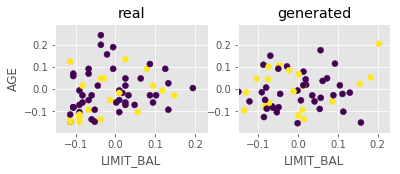

Step: 17100 of 50001.
Losses: G, D Gen, D Real: 0.5488, 0.5875, 0.6082
D Real - D Gen: 0.0207


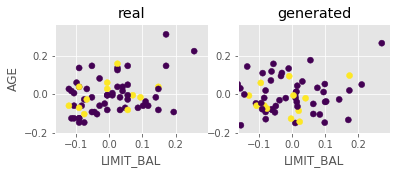

Step: 17200 of 50001.
Losses: G, D Gen, D Real: 0.5136, 0.6041, 0.5655
D Real - D Gen: -0.0386


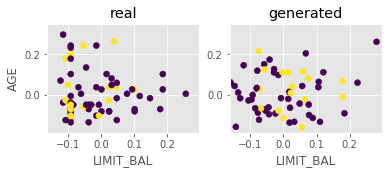

Step: 17300 of 50001.
Losses: G, D Gen, D Real: 0.4743, 0.5716, 0.5754
D Real - D Gen: 0.0038


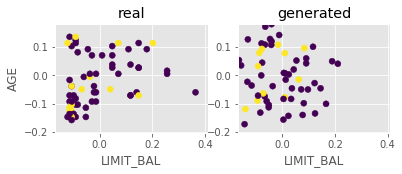

Step: 17400 of 50001.
Losses: G, D Gen, D Real: 0.6419, 0.5994, 0.6083
D Real - D Gen: 0.0088


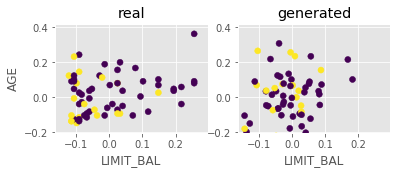

Step: 17500 of 50001.
Losses: G, D Gen, D Real: 0.4688, 0.5623, 0.5828
D Real - D Gen: 0.0205


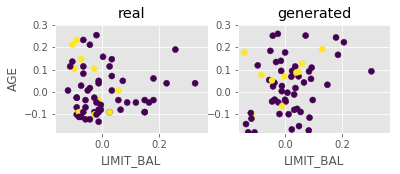

Step: 17600 of 50001.
Losses: G, D Gen, D Real: 0.4224, 0.5514, 0.5706
D Real - D Gen: 0.0193


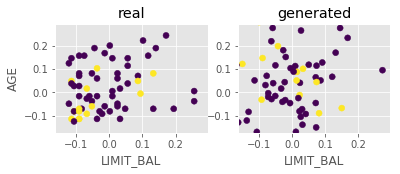

Step: 17700 of 50001.
Losses: G, D Gen, D Real: 0.3936, 0.5644, 0.5289
D Real - D Gen: -0.0355


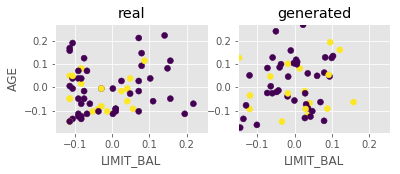

Step: 17800 of 50001.
Losses: G, D Gen, D Real: 0.3781, 0.5471, 0.6356
D Real - D Gen: 0.0886


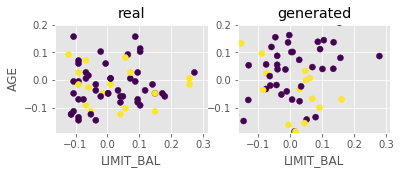

Step: 17900 of 50001.
Losses: G, D Gen, D Real: 0.5979, 0.6195, 0.6366
D Real - D Gen: 0.0172


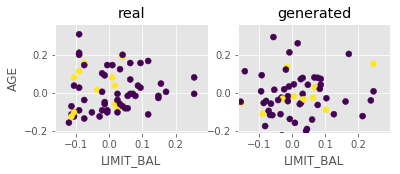

Step: 18000 of 50001.
Losses: G, D Gen, D Real: 0.4966, 0.5760, 0.5941
D Real - D Gen: 0.0181


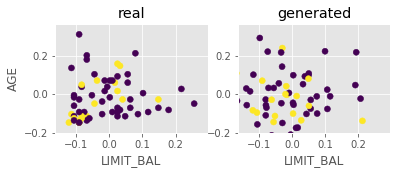

Step: 18100 of 50001.
Losses: G, D Gen, D Real: 0.4458, 0.5812, 0.5938
D Real - D Gen: 0.0126


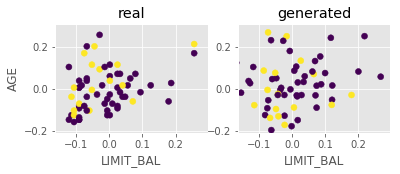

Step: 18200 of 50001.
Losses: G, D Gen, D Real: 0.4096, 0.5467, 0.5930
D Real - D Gen: 0.0463


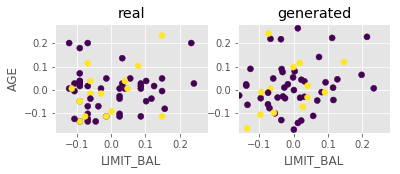

Step: 18300 of 50001.
Losses: G, D Gen, D Real: 0.7601, 0.6535, 0.6564
D Real - D Gen: 0.0029


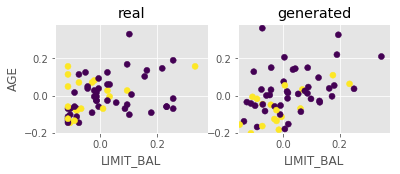

Step: 18400 of 50001.
Losses: G, D Gen, D Real: 0.5594, 0.5823, 0.6018
D Real - D Gen: 0.0195


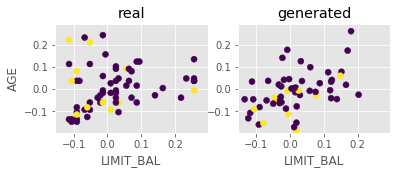

Step: 18500 of 50001.
Losses: G, D Gen, D Real: 0.4956, 0.5691, 0.6574
D Real - D Gen: 0.0883


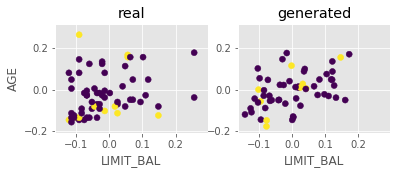

Step: 18600 of 50001.
Losses: G, D Gen, D Real: 0.4291, 0.5640, 0.6553
D Real - D Gen: 0.0913


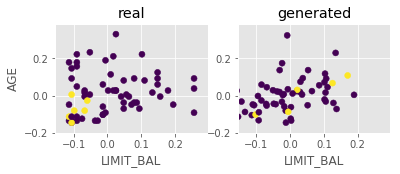

Step: 18700 of 50001.
Losses: G, D Gen, D Real: 0.4049, 0.5523, 0.5360
D Real - D Gen: -0.0164


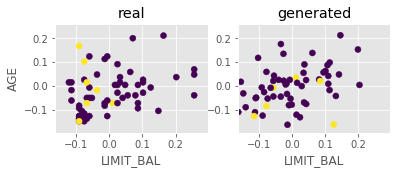

Step: 18800 of 50001.
Losses: G, D Gen, D Real: 0.6453, 0.6504, 0.5763
D Real - D Gen: -0.0741


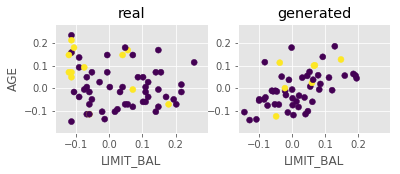

Step: 18900 of 50001.
Losses: G, D Gen, D Real: 0.5539, 0.5872, 0.5864
D Real - D Gen: -0.0008


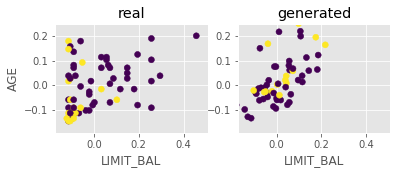

Step: 19000 of 50001.
Losses: G, D Gen, D Real: 0.4872, 0.5936, 0.5665
D Real - D Gen: -0.0271


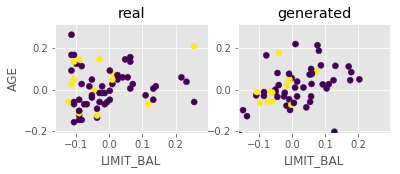

Step: 19100 of 50001.
Losses: G, D Gen, D Real: 0.4626, 0.6034, 0.6049
D Real - D Gen: 0.0015


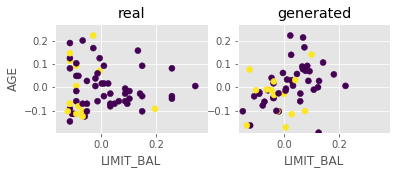

Step: 19200 of 50001.
Losses: G, D Gen, D Real: 0.4193, 0.5981, 0.6050
D Real - D Gen: 0.0069


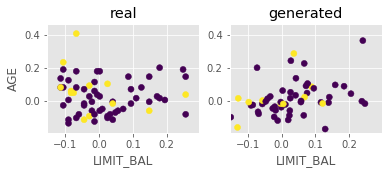

Step: 19300 of 50001.
Losses: G, D Gen, D Real: 0.5900, 0.5994, 0.6322
D Real - D Gen: 0.0328


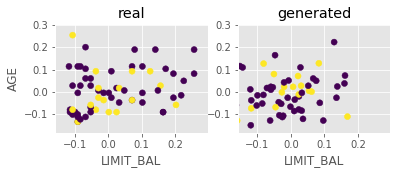

Step: 19400 of 50001.
Losses: G, D Gen, D Real: 0.4878, 0.5951, 0.6048
D Real - D Gen: 0.0098


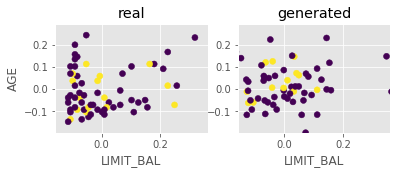

Step: 19500 of 50001.
Losses: G, D Gen, D Real: 0.4796, 0.5941, 0.5682
D Real - D Gen: -0.0258


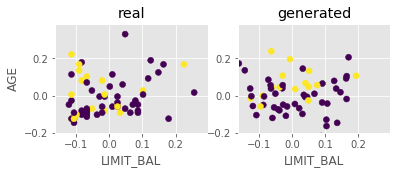

Step: 19600 of 50001.
Losses: G, D Gen, D Real: 0.4526, 0.5828, 0.6435
D Real - D Gen: 0.0606


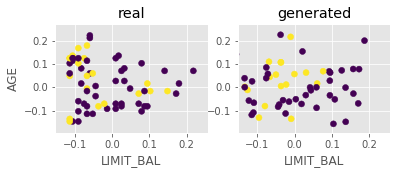

Step: 19700 of 50001.
Losses: G, D Gen, D Real: 0.7300, 0.6331, 0.6109
D Real - D Gen: -0.0222


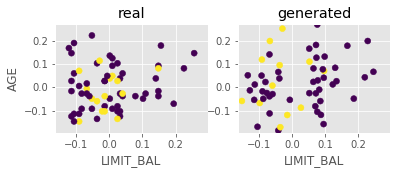

Step: 19800 of 50001.
Losses: G, D Gen, D Real: 0.5474, 0.6276, 0.5909
D Real - D Gen: -0.0368


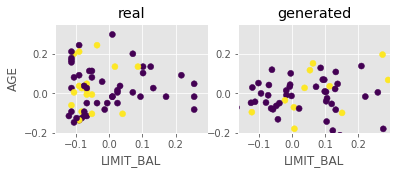

Step: 19900 of 50001.
Losses: G, D Gen, D Real: 0.4861, 0.6088, 0.6013
D Real - D Gen: -0.0075


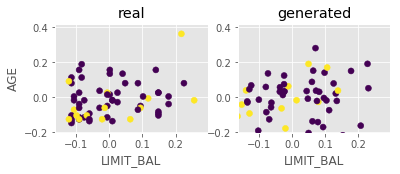

Step: 20000 of 50001.
Losses: G, D Gen, D Real: 0.4516, 0.5733, 0.6120
D Real - D Gen: 0.0387


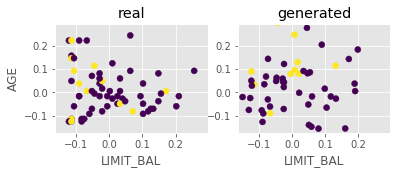

Step: 20100 of 50001.
Losses: G, D Gen, D Real: 0.4396, 0.5890, 0.6204
D Real - D Gen: 0.0314


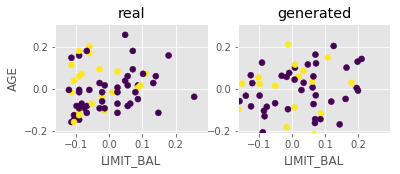

Step: 20200 of 50001.
Losses: G, D Gen, D Real: 0.6656, 0.6146, 0.5699
D Real - D Gen: -0.0447


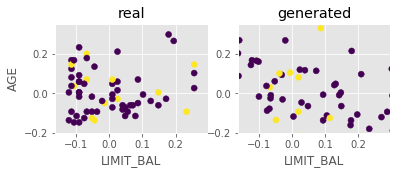

Step: 20300 of 50001.
Losses: G, D Gen, D Real: 0.5204, 0.6055, 0.5489
D Real - D Gen: -0.0567


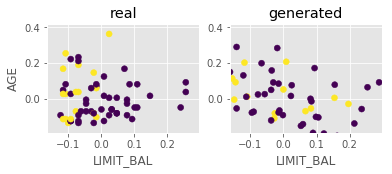

Step: 20400 of 50001.
Losses: G, D Gen, D Real: 0.4684, 0.5554, 0.5398
D Real - D Gen: -0.0156


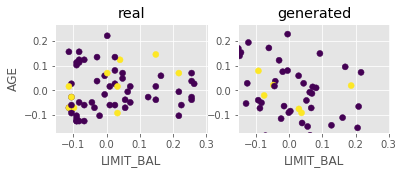

Step: 20500 of 50001.
Losses: G, D Gen, D Real: 0.4065, 0.5587, 0.5782
D Real - D Gen: 0.0195


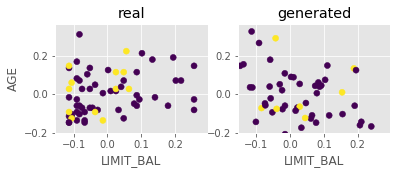

Step: 20600 of 50001.
Losses: G, D Gen, D Real: 0.3755, 0.5544, 0.5552
D Real - D Gen: 0.0009


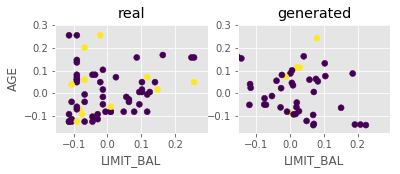

Step: 20700 of 50001.
Losses: G, D Gen, D Real: 0.5452, 0.6204, 0.6215
D Real - D Gen: 0.0011


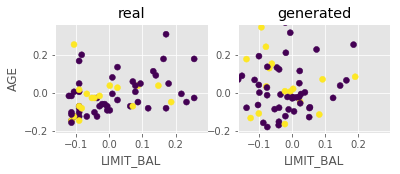

Step: 20800 of 50001.
Losses: G, D Gen, D Real: 0.4471, 0.6205, 0.5419
D Real - D Gen: -0.0785


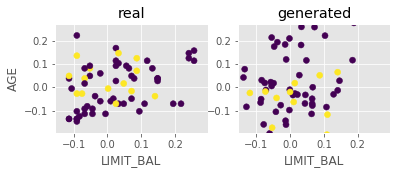

Step: 20900 of 50001.
Losses: G, D Gen, D Real: 0.4118, 0.5903, 0.6151
D Real - D Gen: 0.0248


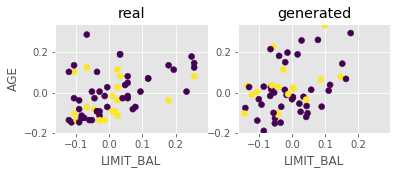

Step: 21000 of 50001.
Losses: G, D Gen, D Real: 0.3931, 0.5772, 0.5499
D Real - D Gen: -0.0273


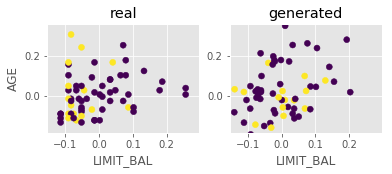

Step: 21100 of 50001.
Losses: G, D Gen, D Real: 0.8275, 0.7093, 0.5627
D Real - D Gen: -0.1465


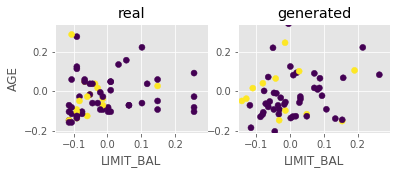

Step: 21200 of 50001.
Losses: G, D Gen, D Real: 0.5801, 0.6501, 0.6195
D Real - D Gen: -0.0306


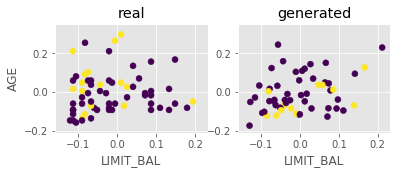

Step: 21300 of 50001.
Losses: G, D Gen, D Real: 0.4891, 0.6173, 0.6023
D Real - D Gen: -0.0150


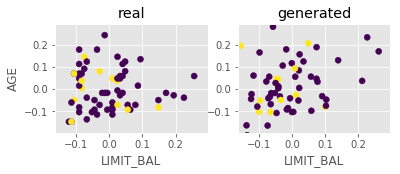

Step: 21400 of 50001.
Losses: G, D Gen, D Real: 0.4300, 0.5714, 0.5783
D Real - D Gen: 0.0069


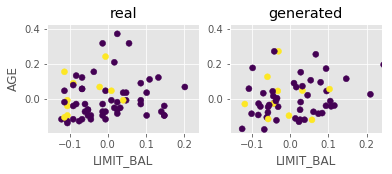

Step: 21500 of 50001.
Losses: G, D Gen, D Real: 0.3968, 0.5737, 0.5563
D Real - D Gen: -0.0173


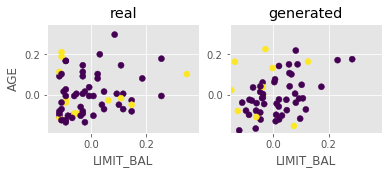

Step: 21600 of 50001.
Losses: G, D Gen, D Real: 0.6336, 0.6383, 0.5687
D Real - D Gen: -0.0696


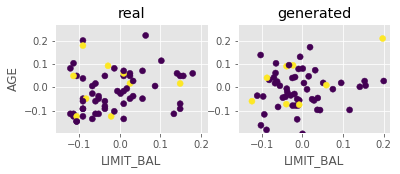

Step: 21700 of 50001.
Losses: G, D Gen, D Real: 0.4739, 0.6225, 0.6189
D Real - D Gen: -0.0036


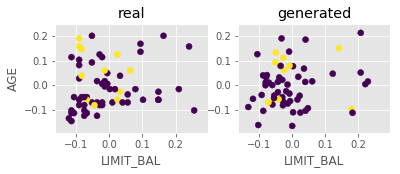

Step: 21800 of 50001.
Losses: G, D Gen, D Real: 0.4527, 0.5860, 0.6303
D Real - D Gen: 0.0443


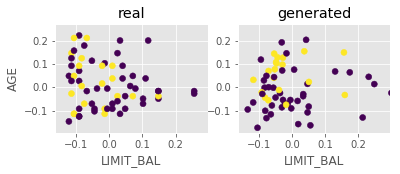

Step: 21900 of 50001.
Losses: G, D Gen, D Real: 0.4184, 0.6333, 0.5447
D Real - D Gen: -0.0886


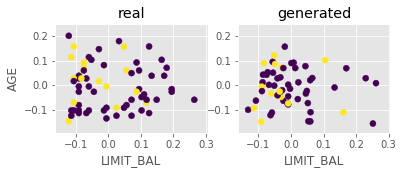

Step: 22000 of 50001.
Losses: G, D Gen, D Real: 0.3883, 0.5709, 0.6149
D Real - D Gen: 0.0441


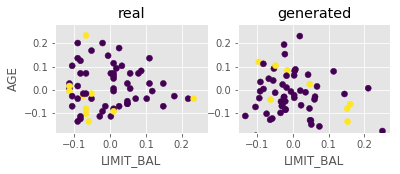

Step: 22100 of 50001.
Losses: G, D Gen, D Real: 0.6137, 0.6201, 0.5825
D Real - D Gen: -0.0375


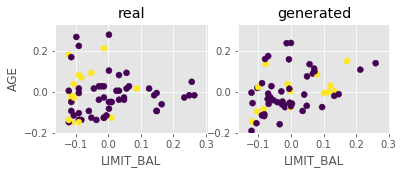

Step: 22200 of 50001.
Losses: G, D Gen, D Real: 0.5039, 0.6126, 0.6095
D Real - D Gen: -0.0031


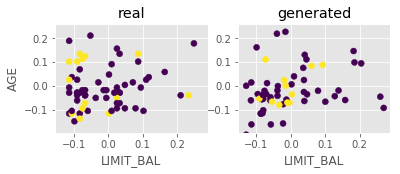

Step: 22300 of 50001.
Losses: G, D Gen, D Real: 0.4695, 0.6116, 0.8891
D Real - D Gen: 0.2775


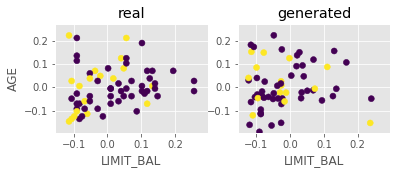

Step: 22400 of 50001.
Losses: G, D Gen, D Real: 0.4647, 0.6118, 0.5742
D Real - D Gen: -0.0377


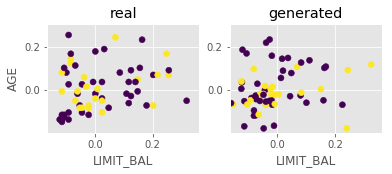

Step: 22500 of 50001.
Losses: G, D Gen, D Real: 0.8056, 0.5869, 0.6626
D Real - D Gen: 0.0757


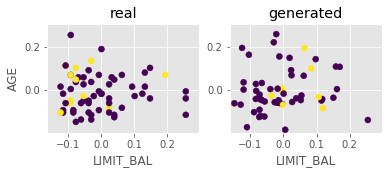

Step: 22600 of 50001.
Losses: G, D Gen, D Real: 0.5500, 0.6046, 0.5989
D Real - D Gen: -0.0056


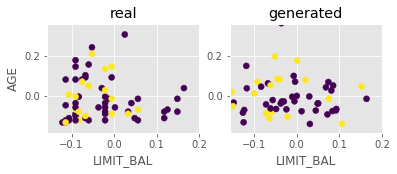

Step: 22700 of 50001.
Losses: G, D Gen, D Real: 0.4490, 0.5953, 0.5924
D Real - D Gen: -0.0029


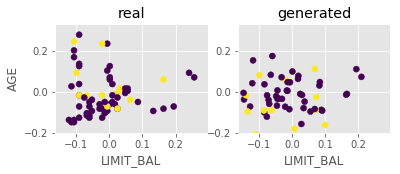

Step: 22800 of 50001.
Losses: G, D Gen, D Real: 0.4365, 0.6021, 0.6543
D Real - D Gen: 0.0521


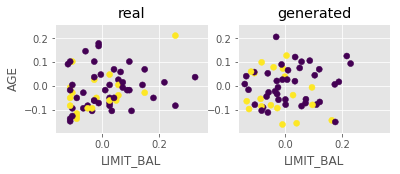

Step: 22900 of 50001.
Losses: G, D Gen, D Real: 0.4076, 0.5849, 0.5823
D Real - D Gen: -0.0026


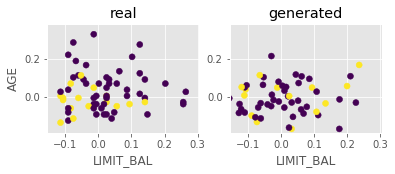

Step: 23000 of 50001.
Losses: G, D Gen, D Real: 0.6917, 0.6380, 0.5755
D Real - D Gen: -0.0624


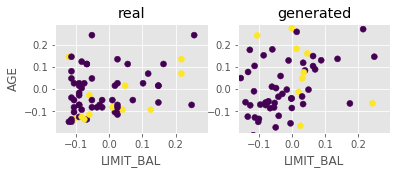

Step: 23100 of 50001.
Losses: G, D Gen, D Real: 0.5420, 0.5844, 0.5971
D Real - D Gen: 0.0127


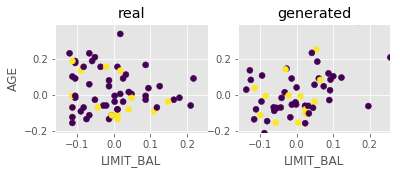

Step: 23200 of 50001.
Losses: G, D Gen, D Real: 0.4932, 0.5483, 0.5716
D Real - D Gen: 0.0233


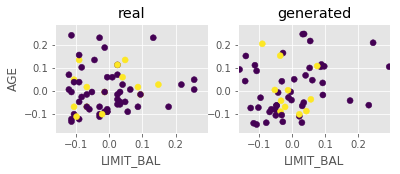

Step: 23300 of 50001.
Losses: G, D Gen, D Real: 0.4610, 0.5483, 0.6056
D Real - D Gen: 0.0573


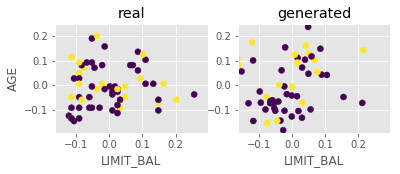

Step: 23400 of 50001.
Losses: G, D Gen, D Real: 0.4091, 0.5630, 0.6148
D Real - D Gen: 0.0518


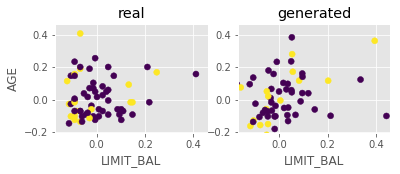

Step: 23500 of 50001.
Losses: G, D Gen, D Real: 0.6267, 0.6003, 0.6768
D Real - D Gen: 0.0765


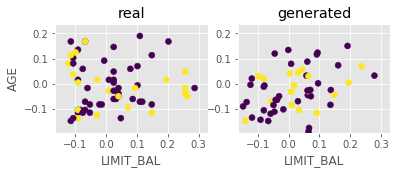

Step: 23600 of 50001.
Losses: G, D Gen, D Real: 0.4961, 0.5864, 0.5778
D Real - D Gen: -0.0086


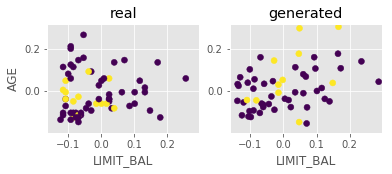

Step: 23700 of 50001.
Losses: G, D Gen, D Real: 0.4737, 0.5767, 0.6541
D Real - D Gen: 0.0774


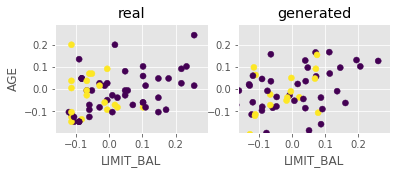

Step: 23800 of 50001.
Losses: G, D Gen, D Real: 0.3877, 0.5601, 0.5712
D Real - D Gen: 0.0111


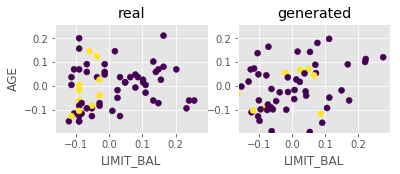

Step: 23900 of 50001.
Losses: G, D Gen, D Real: 0.3721, 0.5627, 0.5696
D Real - D Gen: 0.0069


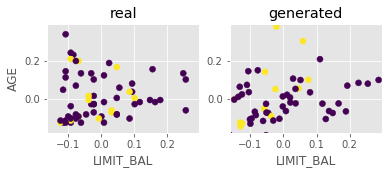

Step: 24000 of 50001.
Losses: G, D Gen, D Real: 0.5873, 0.6230, 0.6050
D Real - D Gen: -0.0180


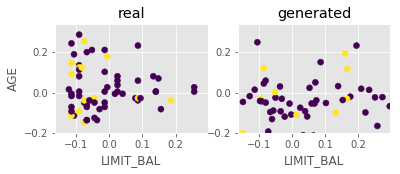

Step: 24100 of 50001.
Losses: G, D Gen, D Real: 0.4810, 0.6022, 0.6136
D Real - D Gen: 0.0114


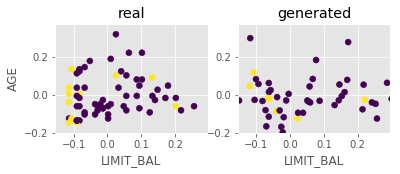

Step: 24200 of 50001.
Losses: G, D Gen, D Real: 0.4597, 0.5706, 0.6467
D Real - D Gen: 0.0761


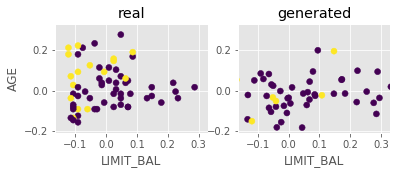

Step: 24300 of 50001.
Losses: G, D Gen, D Real: 0.4488, 0.6137, 0.6108
D Real - D Gen: -0.0030


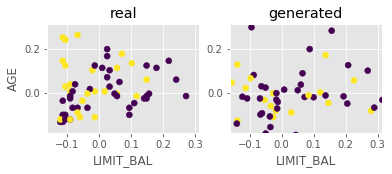

Step: 24400 of 50001.
Losses: G, D Gen, D Real: 0.6394, 0.6239, 0.6015
D Real - D Gen: -0.0223


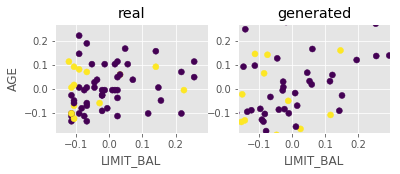

Step: 24500 of 50001.
Losses: G, D Gen, D Real: 0.4529, 0.5915, 0.5870
D Real - D Gen: -0.0045


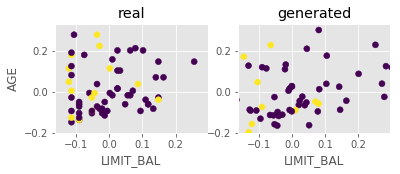

Step: 24600 of 50001.
Losses: G, D Gen, D Real: 0.3715, 0.5652, 0.5093
D Real - D Gen: -0.0559


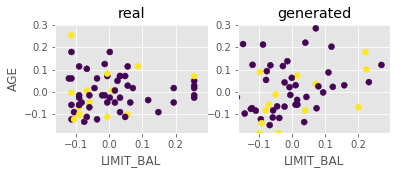

Step: 24700 of 50001.
Losses: G, D Gen, D Real: 0.3339, 0.5565, 0.5568
D Real - D Gen: 0.0002


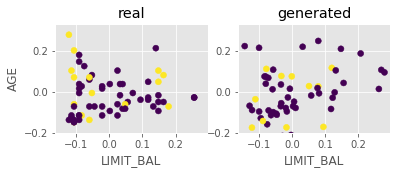

Step: 24800 of 50001.
Losses: G, D Gen, D Real: 0.2627, 0.5558, 0.5513
D Real - D Gen: -0.0046


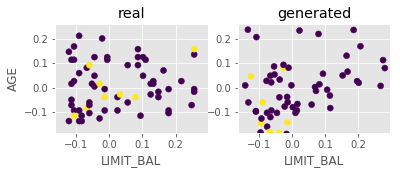

Step: 24900 of 50001.
Losses: G, D Gen, D Real: 0.6798, 0.5842, 0.5799
D Real - D Gen: -0.0044


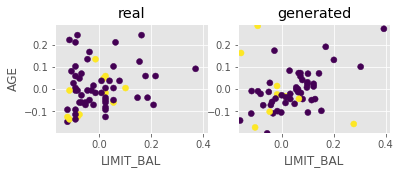

Step: 25000 of 50001.
Losses: G, D Gen, D Real: 0.4689, 0.5719, 0.6784
D Real - D Gen: 0.1064


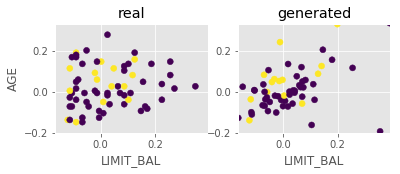

Step: 25100 of 50001.
Losses: G, D Gen, D Real: 0.4019, 0.5819, 0.6296
D Real - D Gen: 0.0477


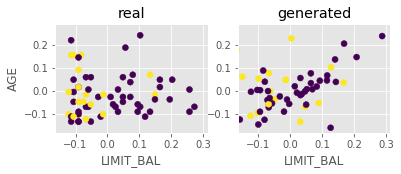

Step: 25200 of 50001.
Losses: G, D Gen, D Real: 0.3881, 0.5681, 0.5888
D Real - D Gen: 0.0207


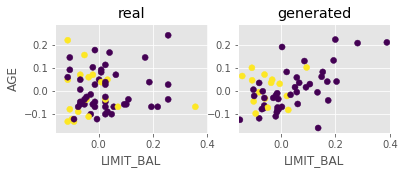

Step: 25300 of 50001.
Losses: G, D Gen, D Real: 0.3123, 0.5181, 0.5641
D Real - D Gen: 0.0460


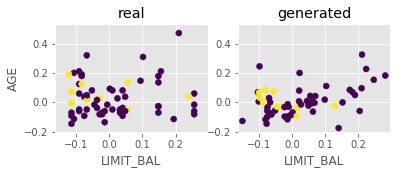

Step: 25400 of 50001.
Losses: G, D Gen, D Real: 0.5364, 0.6080, 0.5778
D Real - D Gen: -0.0302


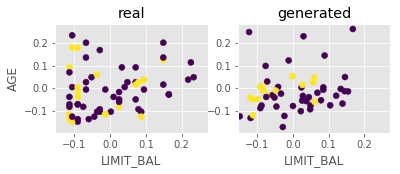

Step: 25500 of 50001.
Losses: G, D Gen, D Real: 0.4436, 0.5627, 0.5876
D Real - D Gen: 0.0249


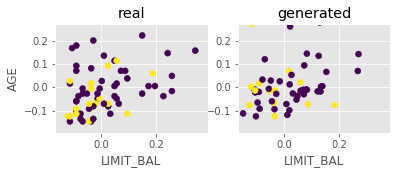

Step: 25600 of 50001.
Losses: G, D Gen, D Real: 0.4232, 0.5830, 0.5627
D Real - D Gen: -0.0203


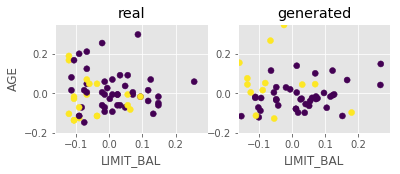

Step: 25700 of 50001.
Losses: G, D Gen, D Real: 0.3993, 0.5783, 0.5822
D Real - D Gen: 0.0039


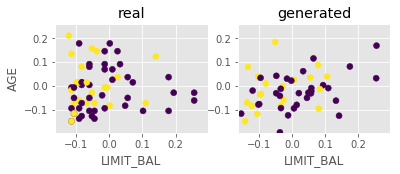

Step: 25800 of 50001.
Losses: G, D Gen, D Real: 0.7570, 0.6877, 0.6076
D Real - D Gen: -0.0800


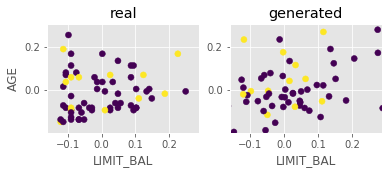

Step: 25900 of 50001.
Losses: G, D Gen, D Real: 0.5367, 0.6470, 0.6601
D Real - D Gen: 0.0131


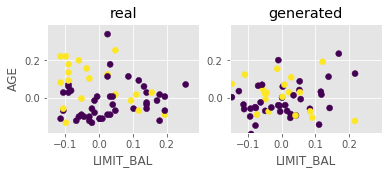

Step: 26000 of 50001.
Losses: G, D Gen, D Real: 0.4438, 0.6068, 0.5512
D Real - D Gen: -0.0556


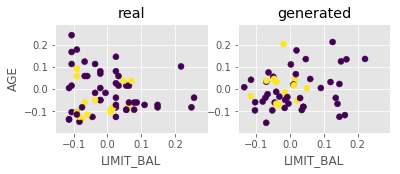

Step: 26100 of 50001.
Losses: G, D Gen, D Real: 0.3979, 0.5875, 0.5717
D Real - D Gen: -0.0158


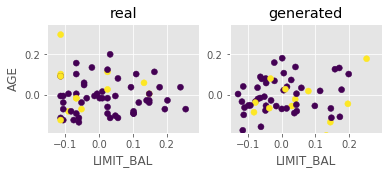

Step: 26200 of 50001.
Losses: G, D Gen, D Real: 0.3578, 0.6014, 0.5723
D Real - D Gen: -0.0291


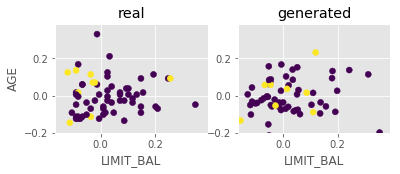

Step: 26300 of 50001.
Losses: G, D Gen, D Real: 0.6655, 0.5976, 0.5670
D Real - D Gen: -0.0306


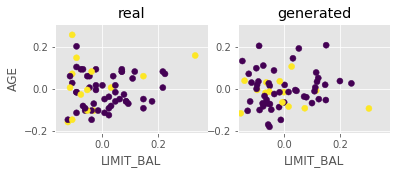

Step: 26400 of 50001.
Losses: G, D Gen, D Real: 0.4968, 0.6167, 0.6713
D Real - D Gen: 0.0546


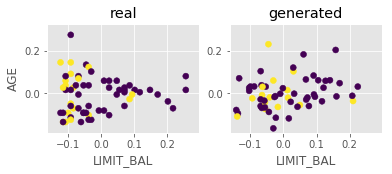

Step: 26500 of 50001.
Losses: G, D Gen, D Real: 0.4274, 0.5801, 0.5839
D Real - D Gen: 0.0037


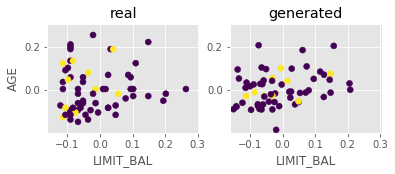

Step: 26600 of 50001.
Losses: G, D Gen, D Real: 0.3939, 0.5753, 0.5774
D Real - D Gen: 0.0021


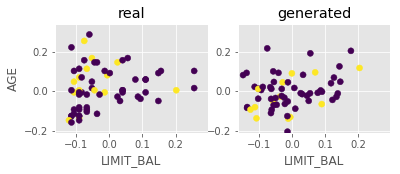

Step: 26700 of 50001.
Losses: G, D Gen, D Real: 0.3685, 0.6098, 0.6012
D Real - D Gen: -0.0086


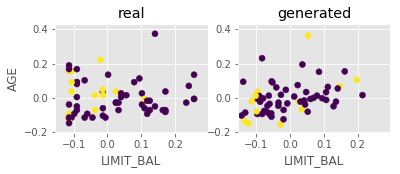

Step: 26800 of 50001.
Losses: G, D Gen, D Real: 0.4872, 0.5749, 0.6168
D Real - D Gen: 0.0419


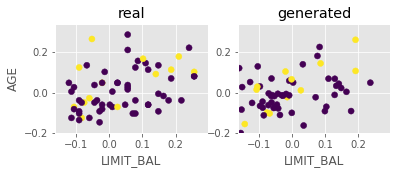

Step: 26900 of 50001.
Losses: G, D Gen, D Real: 0.4227, 0.5812, 0.5128
D Real - D Gen: -0.0684


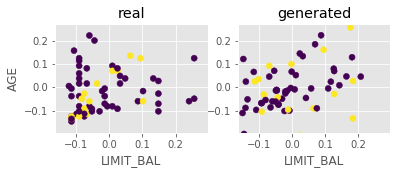

Step: 27000 of 50001.
Losses: G, D Gen, D Real: 0.4195, 0.5776, 0.5982
D Real - D Gen: 0.0205


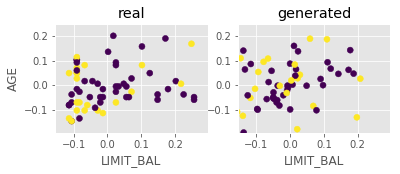

Step: 27100 of 50001.
Losses: G, D Gen, D Real: 0.3383, 0.5413, 0.7310
D Real - D Gen: 0.1897


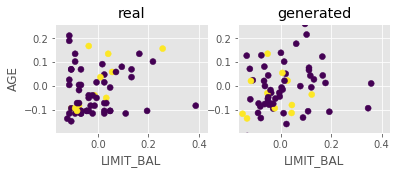

Step: 27200 of 50001.
Losses: G, D Gen, D Real: 0.7168, 0.6401, 0.5150
D Real - D Gen: -0.1250


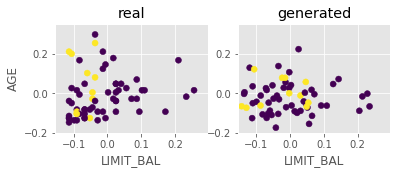

Step: 27300 of 50001.
Losses: G, D Gen, D Real: 0.4769, 0.5851, 0.5901
D Real - D Gen: 0.0050


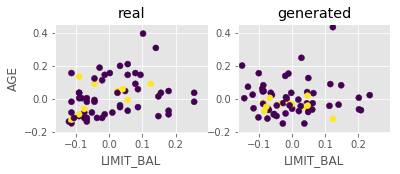

Step: 27400 of 50001.
Losses: G, D Gen, D Real: 0.4307, 0.6126, 0.5489
D Real - D Gen: -0.0637


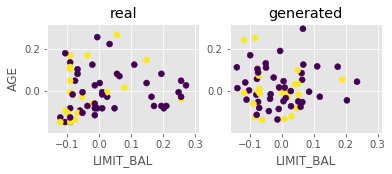

Step: 27500 of 50001.
Losses: G, D Gen, D Real: 0.3427, 0.5244, 0.5028
D Real - D Gen: -0.0216


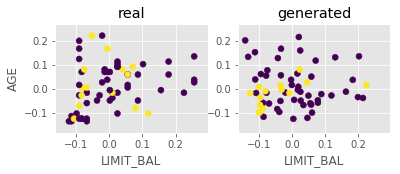

Step: 27600 of 50001.
Losses: G, D Gen, D Real: 0.3285, 0.5390, 0.5222
D Real - D Gen: -0.0168


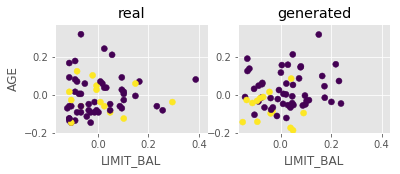

Step: 27700 of 50001.
Losses: G, D Gen, D Real: 0.7002, 0.6650, 0.5740
D Real - D Gen: -0.0910


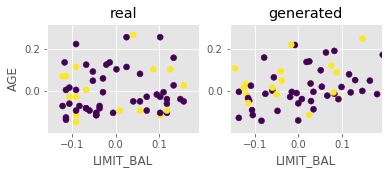

Step: 27800 of 50001.
Losses: G, D Gen, D Real: 0.5043, 0.5737, 0.6330
D Real - D Gen: 0.0592


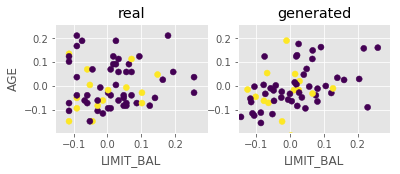

Step: 27900 of 50001.
Losses: G, D Gen, D Real: 0.4341, 0.5748, 0.5886
D Real - D Gen: 0.0138


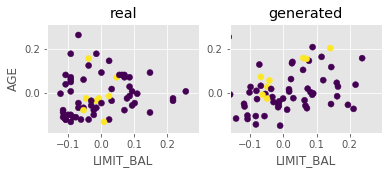

Step: 28000 of 50001.
Losses: G, D Gen, D Real: 0.4126, 0.5475, 0.5568
D Real - D Gen: 0.0093


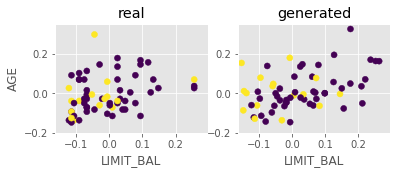

Step: 28100 of 50001.
Losses: G, D Gen, D Real: 0.4022, 0.5538, 0.5545
D Real - D Gen: 0.0007


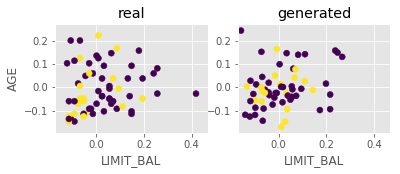

Step: 28200 of 50001.
Losses: G, D Gen, D Real: 0.5548, 0.5878, 0.6130
D Real - D Gen: 0.0252


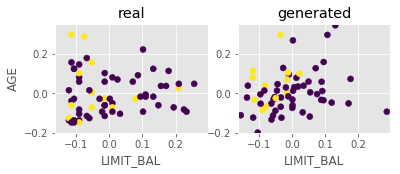

Step: 28300 of 50001.
Losses: G, D Gen, D Real: 0.4212, 0.5755, 0.4924
D Real - D Gen: -0.0830


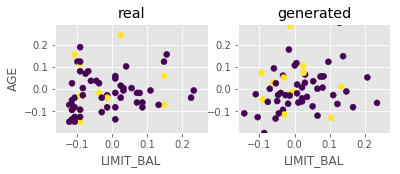

Step: 28400 of 50001.
Losses: G, D Gen, D Real: 0.3697, 0.5463, 0.6228
D Real - D Gen: 0.0764


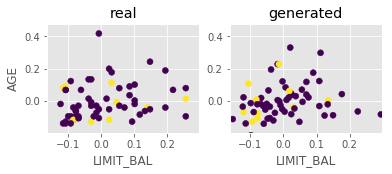

Step: 28500 of 50001.
Losses: G, D Gen, D Real: 0.3690, 0.5688, 0.6120
D Real - D Gen: 0.0431


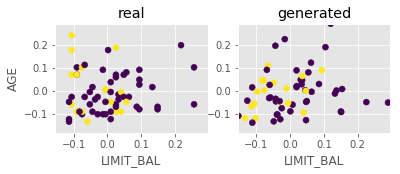

Step: 28600 of 50001.
Losses: G, D Gen, D Real: 0.7429, 0.6498, 0.5722
D Real - D Gen: -0.0776


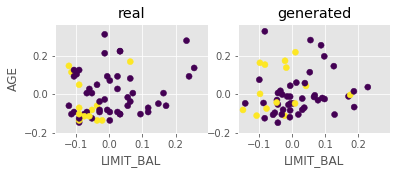

Step: 28700 of 50001.
Losses: G, D Gen, D Real: 0.4573, 0.5599, 0.6273
D Real - D Gen: 0.0674


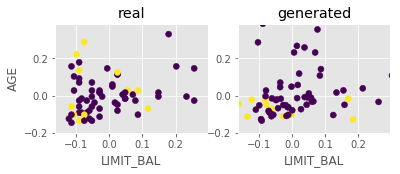

Step: 28800 of 50001.
Losses: G, D Gen, D Real: 0.4032, 0.5847, 0.6203
D Real - D Gen: 0.0356


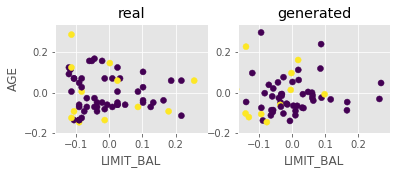

Step: 28900 of 50001.
Losses: G, D Gen, D Real: 0.3418, 0.5768, 0.4909
D Real - D Gen: -0.0859


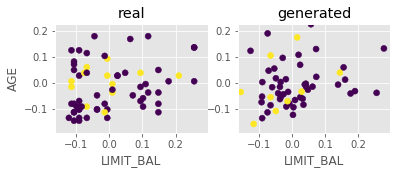

Step: 29000 of 50001.
Losses: G, D Gen, D Real: 0.3266, 0.5594, 0.5776
D Real - D Gen: 0.0181


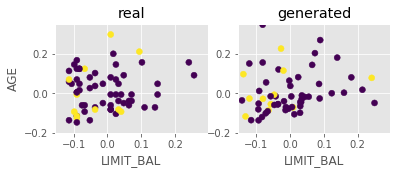

Step: 29100 of 50001.
Losses: G, D Gen, D Real: 0.5983, 0.6698, 0.5706
D Real - D Gen: -0.0992


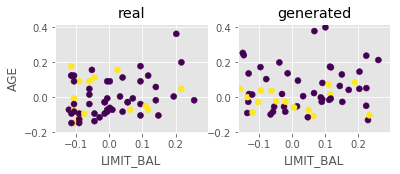

Step: 29200 of 50001.
Losses: G, D Gen, D Real: 0.5306, 0.6026, 0.5539
D Real - D Gen: -0.0487


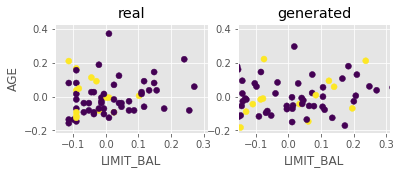

Step: 29300 of 50001.
Losses: G, D Gen, D Real: 0.5118, 0.5516, 0.5948
D Real - D Gen: 0.0432


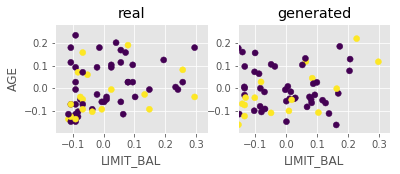

Step: 29400 of 50001.
Losses: G, D Gen, D Real: 0.4812, 0.5281, 0.5456
D Real - D Gen: 0.0175


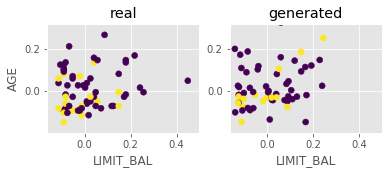

Step: 29500 of 50001.
Losses: G, D Gen, D Real: 0.4339, 0.5479, 0.5218
D Real - D Gen: -0.0261


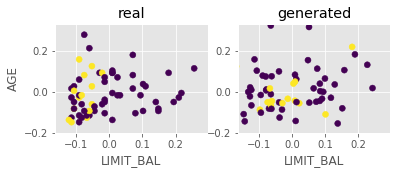

Step: 29600 of 50001.
Losses: G, D Gen, D Real: 0.6172, 0.6200, 0.5227
D Real - D Gen: -0.0973


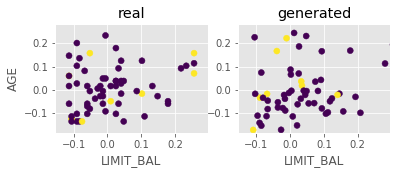

Step: 29700 of 50001.
Losses: G, D Gen, D Real: 0.4972, 0.5832, 0.6534
D Real - D Gen: 0.0702


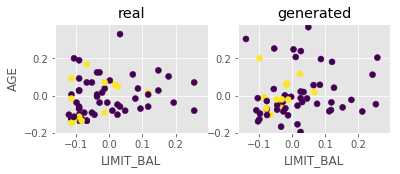

Step: 29800 of 50001.
Losses: G, D Gen, D Real: 0.4566, 0.5642, 0.6656
D Real - D Gen: 0.1013


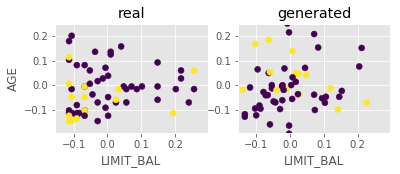

Step: 29900 of 50001.
Losses: G, D Gen, D Real: 0.4072, 0.5790, 0.5781
D Real - D Gen: -0.0009


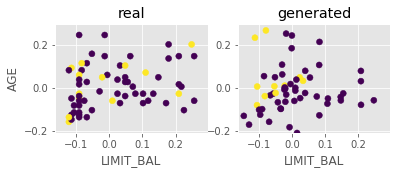

Step: 30000 of 50001.
Losses: G, D Gen, D Real: 0.9936, 0.5795, 0.5906
D Real - D Gen: 0.0111


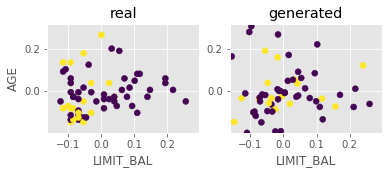

Step: 30100 of 50001.
Losses: G, D Gen, D Real: 0.5293, 0.5720, 0.6343
D Real - D Gen: 0.0622


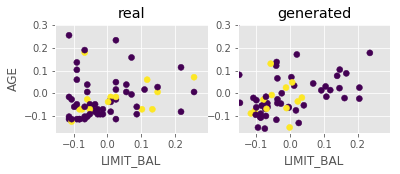

Step: 30200 of 50001.
Losses: G, D Gen, D Real: 0.4599, 0.6068, 0.5532
D Real - D Gen: -0.0537


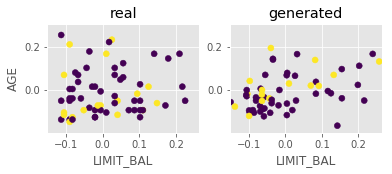

Step: 30300 of 50001.
Losses: G, D Gen, D Real: 0.4012, 0.5484, 0.5916
D Real - D Gen: 0.0432


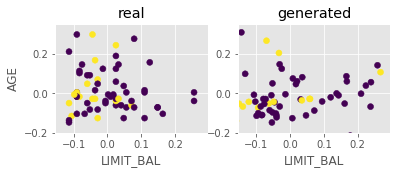

Step: 30400 of 50001.
Losses: G, D Gen, D Real: 0.3402, 0.5630, 0.5733
D Real - D Gen: 0.0103


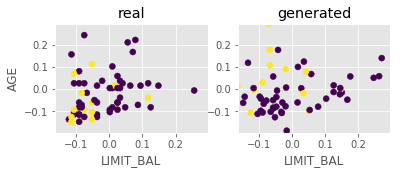

Step: 30500 of 50001.
Losses: G, D Gen, D Real: 0.6274, 0.5866, 0.5354
D Real - D Gen: -0.0512


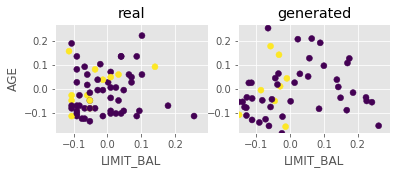

Step: 30600 of 50001.
Losses: G, D Gen, D Real: 0.4634, 0.6049, 0.5175
D Real - D Gen: -0.0873


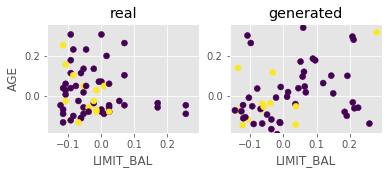

Step: 30700 of 50001.
Losses: G, D Gen, D Real: 0.4090, 0.5686, 0.5561
D Real - D Gen: -0.0125


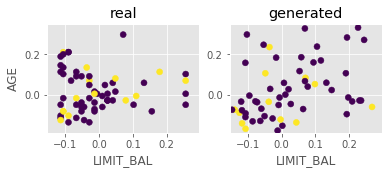

Step: 30800 of 50001.
Losses: G, D Gen, D Real: 0.3351, 0.5659, 0.6252
D Real - D Gen: 0.0593


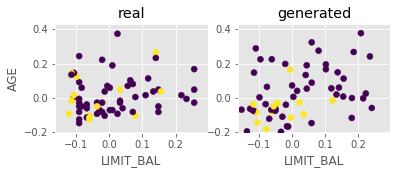

Step: 30900 of 50001.
Losses: G, D Gen, D Real: 0.3803, 0.5582, 0.4946
D Real - D Gen: -0.0637


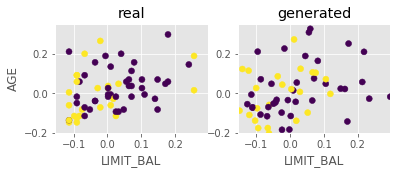

Step: 31000 of 50001.
Losses: G, D Gen, D Real: 0.5734, 0.5514, 0.5882
D Real - D Gen: 0.0368


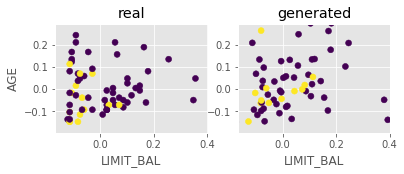

Step: 31100 of 50001.
Losses: G, D Gen, D Real: 0.4594, 0.5275, 0.5413
D Real - D Gen: 0.0138


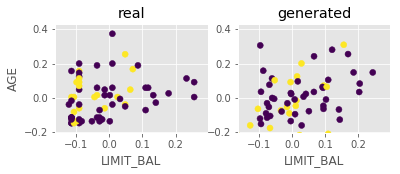

Step: 31200 of 50001.
Losses: G, D Gen, D Real: 0.3994, 0.4867, 0.5691
D Real - D Gen: 0.0825


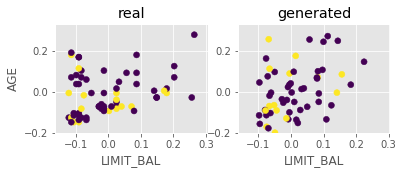

Step: 31300 of 50001.
Losses: G, D Gen, D Real: 0.3799, 0.5221, 0.5298
D Real - D Gen: 0.0077


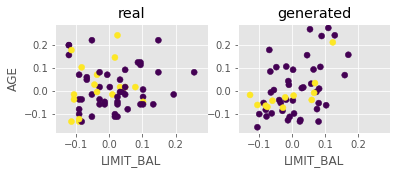

Step: 31400 of 50001.
Losses: G, D Gen, D Real: 0.3445, 0.4770, 0.5601
D Real - D Gen: 0.0831


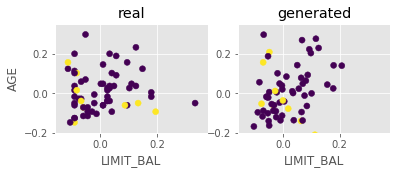

Step: 31500 of 50001.
Losses: G, D Gen, D Real: 0.5092, 0.5608, 0.6001
D Real - D Gen: 0.0393


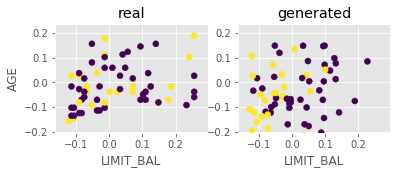

Step: 31600 of 50001.
Losses: G, D Gen, D Real: 0.3952, 0.5324, 0.5852
D Real - D Gen: 0.0529


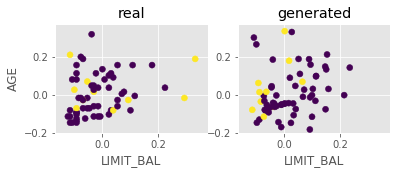

Step: 31700 of 50001.
Losses: G, D Gen, D Real: 0.3301, 0.5079, 0.4676
D Real - D Gen: -0.0403


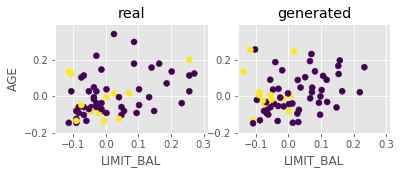

Step: 31800 of 50001.
Losses: G, D Gen, D Real: 0.3327, 0.5076, 0.5342
D Real - D Gen: 0.0266


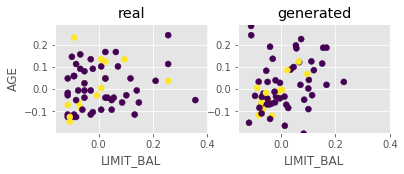

Step: 31900 of 50001.
Losses: G, D Gen, D Real: 0.6883, 0.5366, 0.5576
D Real - D Gen: 0.0210


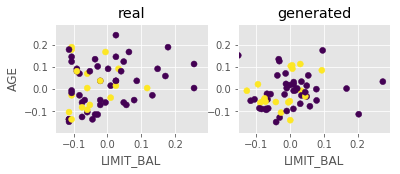

Step: 32000 of 50001.
Losses: G, D Gen, D Real: 0.4741, 0.5131, 0.4602
D Real - D Gen: -0.0530


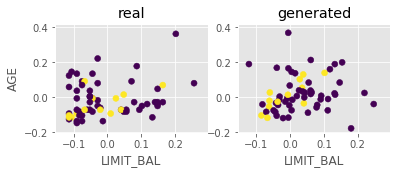

Step: 32100 of 50001.
Losses: G, D Gen, D Real: 0.3994, 0.5340, 0.4805
D Real - D Gen: -0.0535


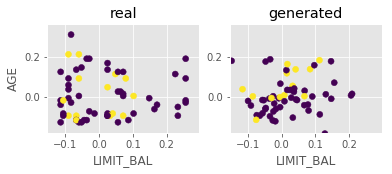

Step: 32200 of 50001.
Losses: G, D Gen, D Real: 0.3471, 0.5066, 0.5162
D Real - D Gen: 0.0096


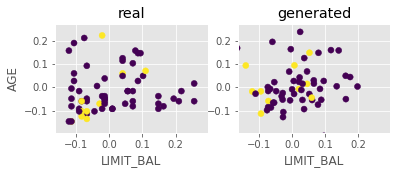

Step: 32300 of 50001.
Losses: G, D Gen, D Real: 0.3041, 0.4852, 0.5335
D Real - D Gen: 0.0483


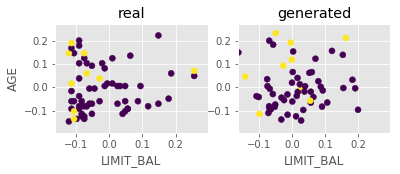

Step: 32400 of 50001.
Losses: G, D Gen, D Real: 0.7128, 0.6384, 0.6216
D Real - D Gen: -0.0168


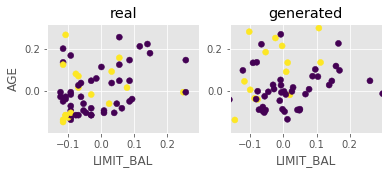

Step: 32500 of 50001.
Losses: G, D Gen, D Real: 0.5400, 0.5931, 0.6028
D Real - D Gen: 0.0097


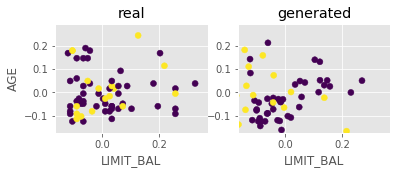

Step: 32600 of 50001.
Losses: G, D Gen, D Real: 0.4296, 0.5713, 0.5828
D Real - D Gen: 0.0115


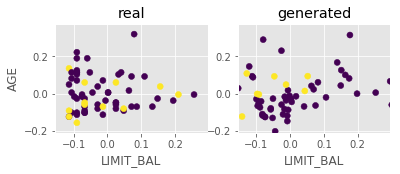

Step: 32700 of 50001.
Losses: G, D Gen, D Real: 0.4304, 0.5642, 0.6242
D Real - D Gen: 0.0600


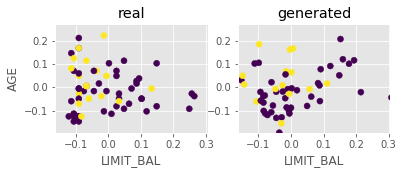

Step: 32800 of 50001.
Losses: G, D Gen, D Real: 0.3497, 0.5527, 0.6626
D Real - D Gen: 0.1099


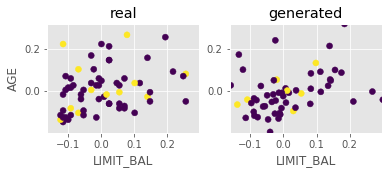

Step: 32900 of 50001.
Losses: G, D Gen, D Real: 0.5684, 0.5535, 0.6119
D Real - D Gen: 0.0584


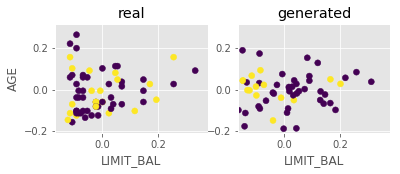

Step: 33000 of 50001.
Losses: G, D Gen, D Real: 0.4603, 0.5365, 0.5430
D Real - D Gen: 0.0065


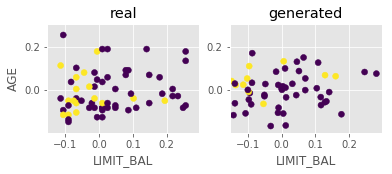

Step: 33100 of 50001.
Losses: G, D Gen, D Real: 0.3926, 0.5413, 0.6786
D Real - D Gen: 0.1373


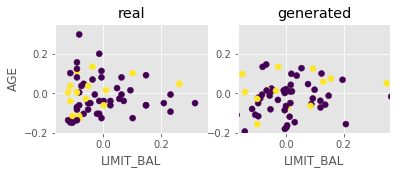

Step: 33200 of 50001.
Losses: G, D Gen, D Real: 0.3638, 0.5465, 0.5209
D Real - D Gen: -0.0256


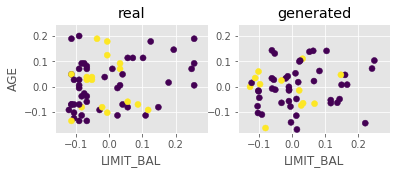

Step: 33300 of 50001.
Losses: G, D Gen, D Real: 0.8878, 0.5903, 0.6020
D Real - D Gen: 0.0116


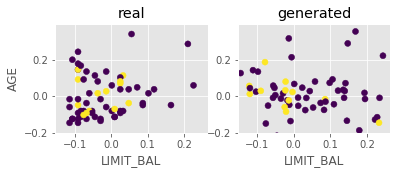

Step: 33400 of 50001.
Losses: G, D Gen, D Real: 0.5184, 0.5800, 0.4770
D Real - D Gen: -0.1030


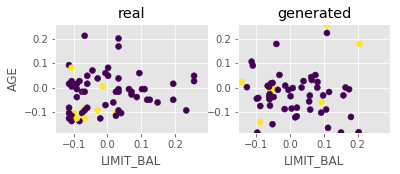

Step: 33500 of 50001.
Losses: G, D Gen, D Real: 0.4470, 0.5594, 0.6140
D Real - D Gen: 0.0546


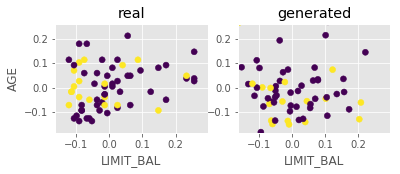

Step: 33600 of 50001.
Losses: G, D Gen, D Real: 0.3424, 0.5203, 0.5577
D Real - D Gen: 0.0374


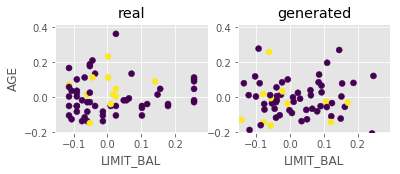

Step: 33700 of 50001.
Losses: G, D Gen, D Real: 0.3281, 0.5494, 0.5361
D Real - D Gen: -0.0134


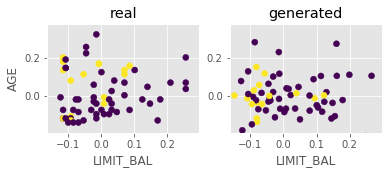

Step: 33800 of 50001.
Losses: G, D Gen, D Real: 0.6813, 0.5845, 0.6303
D Real - D Gen: 0.0458


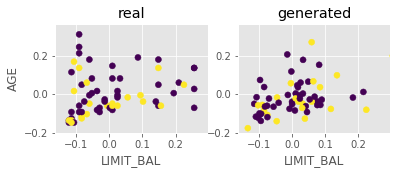

Step: 33900 of 50001.
Losses: G, D Gen, D Real: 0.4258, 0.5226, 0.6122
D Real - D Gen: 0.0896


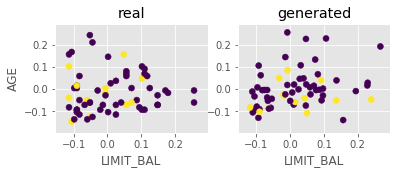

Step: 34000 of 50001.
Losses: G, D Gen, D Real: 0.4120, 0.5265, 0.5236
D Real - D Gen: -0.0030


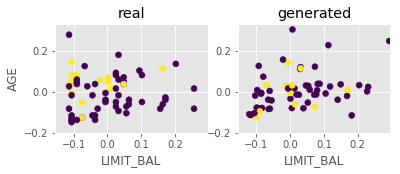

Step: 34100 of 50001.
Losses: G, D Gen, D Real: 0.3902, 0.5322, 0.5351
D Real - D Gen: 0.0029


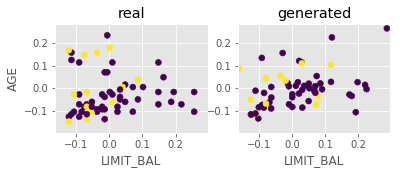

Step: 34200 of 50001.
Losses: G, D Gen, D Real: 0.3371, 0.4739, 0.4982
D Real - D Gen: 0.0243


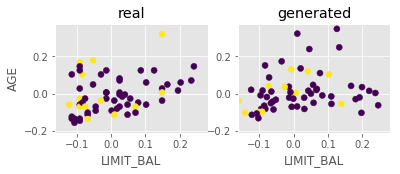

Step: 34300 of 50001.
Losses: G, D Gen, D Real: 0.5611, 0.5980, 0.6176
D Real - D Gen: 0.0195


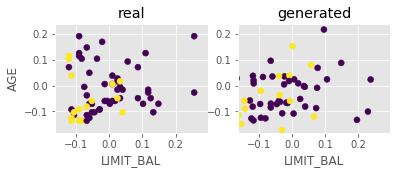

Step: 34400 of 50001.
Losses: G, D Gen, D Real: 0.4488, 0.5588, 0.7576
D Real - D Gen: 0.1988


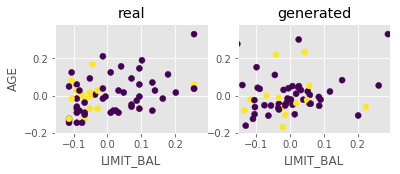

Step: 34500 of 50001.
Losses: G, D Gen, D Real: 0.4049, 0.5175, 0.5896
D Real - D Gen: 0.0721


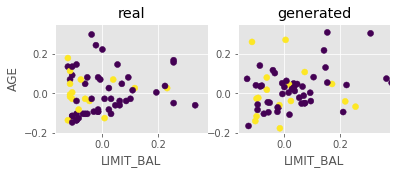

Step: 34600 of 50001.
Losses: G, D Gen, D Real: 0.3435, 0.5305, 0.6734
D Real - D Gen: 0.1429


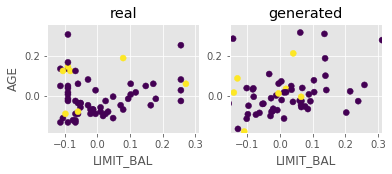

Step: 34700 of 50001.
Losses: G, D Gen, D Real: 0.8699, 0.6398, 0.5662
D Real - D Gen: -0.0736


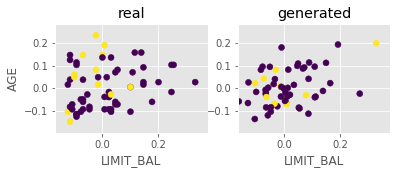

Step: 34800 of 50001.
Losses: G, D Gen, D Real: 0.6124, 0.5815, 0.5431
D Real - D Gen: -0.0383


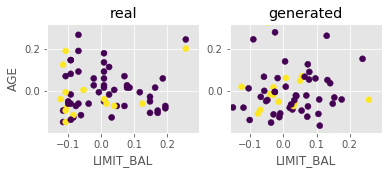

Step: 34900 of 50001.
Losses: G, D Gen, D Real: 0.4945, 0.5994, 0.5775
D Real - D Gen: -0.0220


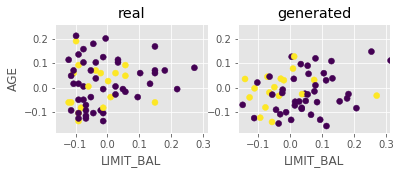

Step: 35000 of 50001.
Losses: G, D Gen, D Real: 0.4075, 0.5739, 0.5727
D Real - D Gen: -0.0012


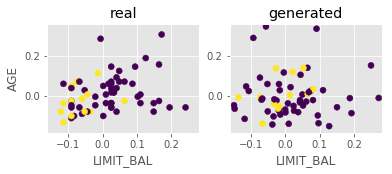

Step: 35100 of 50001.
Losses: G, D Gen, D Real: 0.3605, 0.5382, 0.5565
D Real - D Gen: 0.0183


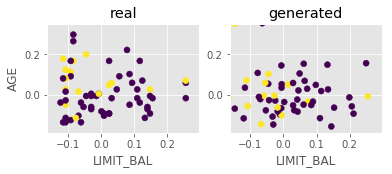

Step: 35200 of 50001.
Losses: G, D Gen, D Real: 0.7621, 0.5836, 0.5694
D Real - D Gen: -0.0143


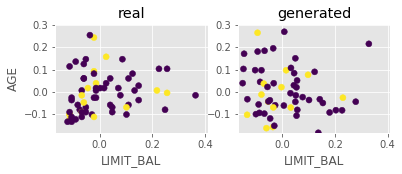

Step: 35300 of 50001.
Losses: G, D Gen, D Real: 0.4939, 0.5700, 0.7357
D Real - D Gen: 0.1657


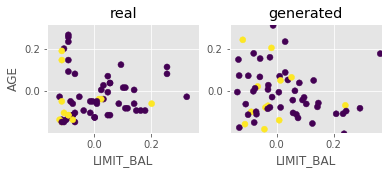

Step: 35400 of 50001.
Losses: G, D Gen, D Real: 0.4360, 0.5263, 0.5690
D Real - D Gen: 0.0427


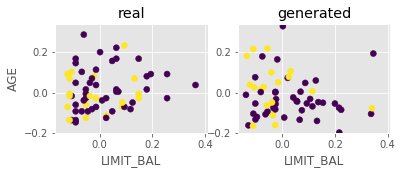

Step: 35500 of 50001.
Losses: G, D Gen, D Real: 0.4033, 0.5469, 0.5052
D Real - D Gen: -0.0417


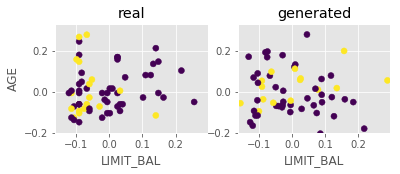

Step: 35600 of 50001.
Losses: G, D Gen, D Real: 0.3361, 0.5093, 0.5922
D Real - D Gen: 0.0828


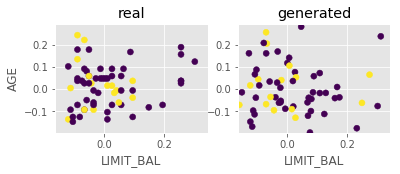

Step: 35700 of 50001.
Losses: G, D Gen, D Real: 0.4537, 0.5563, 0.5267
D Real - D Gen: -0.0296


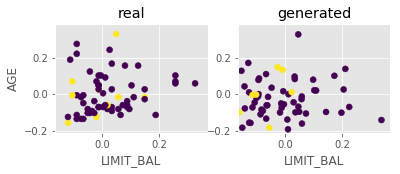

Step: 35800 of 50001.
Losses: G, D Gen, D Real: 0.3695, 0.5679, 0.5841
D Real - D Gen: 0.0162


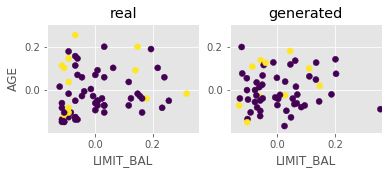

Step: 35900 of 50001.
Losses: G, D Gen, D Real: 0.3873, 0.5678, 0.5949
D Real - D Gen: 0.0271


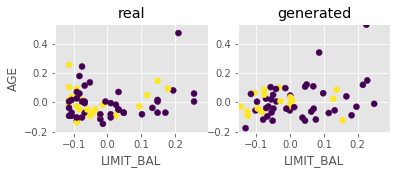

Step: 36000 of 50001.
Losses: G, D Gen, D Real: 0.2778, 0.5322, 0.5975
D Real - D Gen: 0.0653


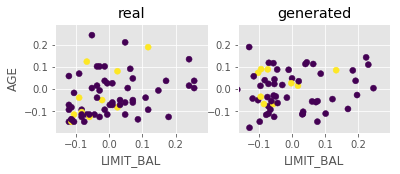

Step: 36100 of 50001.
Losses: G, D Gen, D Real: 0.8076, 0.6881, 0.5053
D Real - D Gen: -0.1828


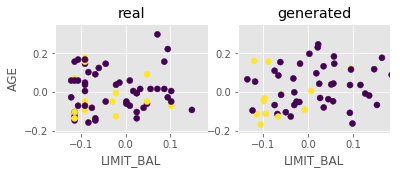

Step: 36200 of 50001.
Losses: G, D Gen, D Real: 0.4944, 0.5838, 0.5516
D Real - D Gen: -0.0322


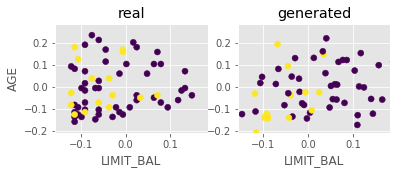

Step: 36300 of 50001.
Losses: G, D Gen, D Real: 0.3996, 0.4931, 0.4943
D Real - D Gen: 0.0011


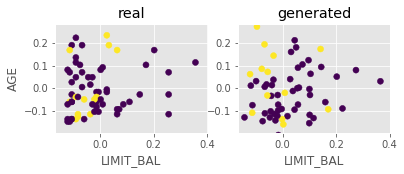

Step: 36400 of 50001.
Losses: G, D Gen, D Real: 0.3364, 0.5302, 0.5199
D Real - D Gen: -0.0103


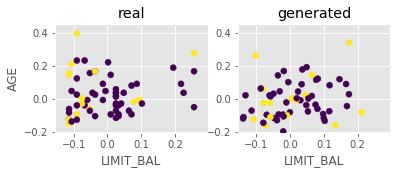

Step: 36500 of 50001.
Losses: G, D Gen, D Real: 0.3081, 0.4767, 0.4960
D Real - D Gen: 0.0194


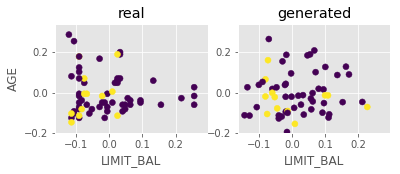

Step: 36600 of 50001.
Losses: G, D Gen, D Real: 0.6417, 0.5619, 0.5484
D Real - D Gen: -0.0135


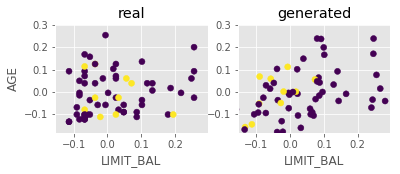

Step: 36700 of 50001.
Losses: G, D Gen, D Real: 0.4461, 0.5334, 0.4631
D Real - D Gen: -0.0703


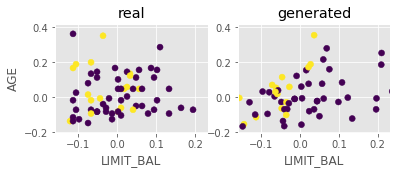

Step: 36800 of 50001.
Losses: G, D Gen, D Real: 0.3631, 0.5194, 0.4900
D Real - D Gen: -0.0294


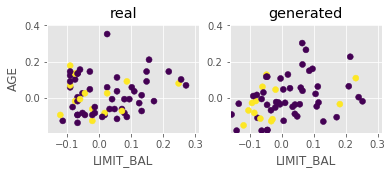

Step: 36900 of 50001.
Losses: G, D Gen, D Real: 0.2988, 0.5109, 0.5702
D Real - D Gen: 0.0594


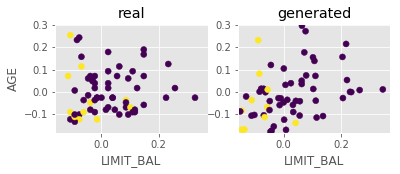

Step: 37000 of 50001.
Losses: G, D Gen, D Real: 0.2448, 0.5027, 0.4691
D Real - D Gen: -0.0337


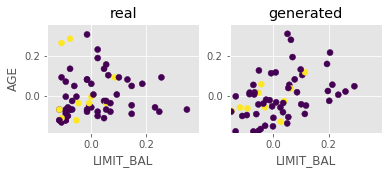

Step: 37100 of 50001.
Losses: G, D Gen, D Real: 0.6010, 0.5391, 0.4498
D Real - D Gen: -0.0892


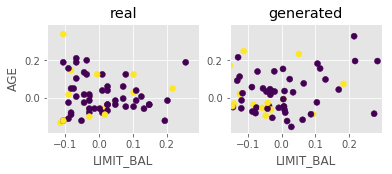

Step: 37200 of 50001.
Losses: G, D Gen, D Real: 0.4185, 0.5004, 0.5269
D Real - D Gen: 0.0265


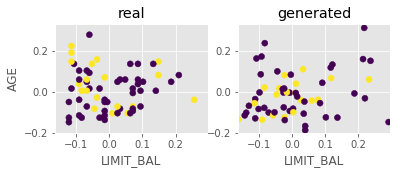

Step: 37300 of 50001.
Losses: G, D Gen, D Real: 0.3283, 0.4704, 0.5476
D Real - D Gen: 0.0772


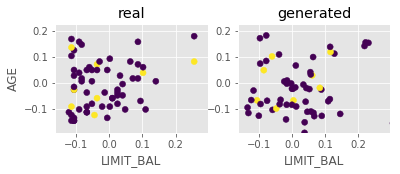

Step: 37400 of 50001.
Losses: G, D Gen, D Real: 0.3156, 0.4475, 0.4980
D Real - D Gen: 0.0505


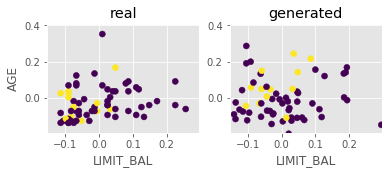

Step: 37500 of 50001.
Losses: G, D Gen, D Real: 1.0177, 0.5136, 0.4896
D Real - D Gen: -0.0240


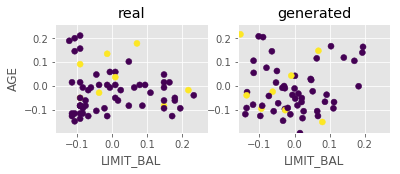

Step: 37600 of 50001.
Losses: G, D Gen, D Real: 0.4539, 0.5282, 0.5320
D Real - D Gen: 0.0038


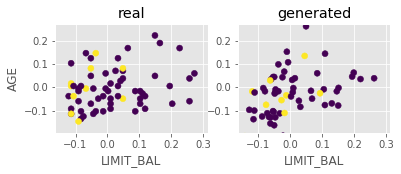

Step: 37700 of 50001.
Losses: G, D Gen, D Real: 0.3760, 0.5092, 0.5295
D Real - D Gen: 0.0203


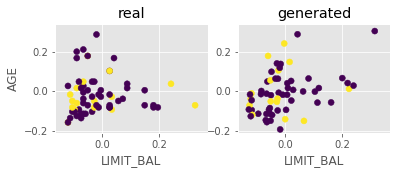

Step: 37800 of 50001.
Losses: G, D Gen, D Real: 0.3078, 0.5295, 0.4682
D Real - D Gen: -0.0613


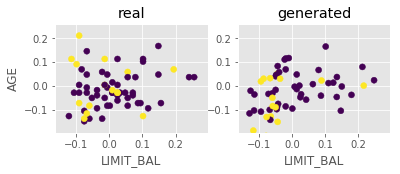

Step: 37900 of 50001.
Losses: G, D Gen, D Real: 0.2624, 0.5153, 0.5351
D Real - D Gen: 0.0198


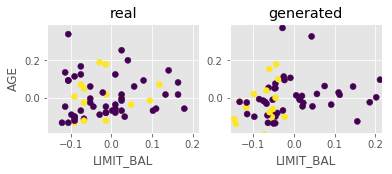

Step: 38000 of 50001.
Losses: G, D Gen, D Real: 0.6437, 0.5854, 0.5264
D Real - D Gen: -0.0590


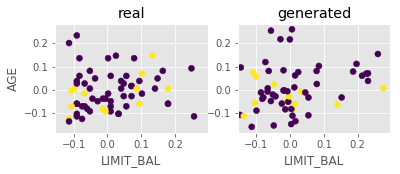

Step: 38100 of 50001.
Losses: G, D Gen, D Real: 0.4522, 0.5380, 0.5663
D Real - D Gen: 0.0283


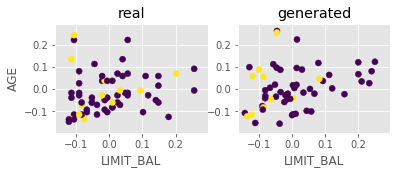

Step: 38200 of 50001.
Losses: G, D Gen, D Real: 0.3668, 0.4986, 0.5227
D Real - D Gen: 0.0241


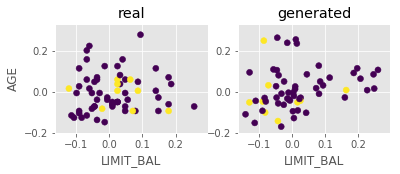

Step: 38300 of 50001.
Losses: G, D Gen, D Real: 0.3276, 0.5295, 0.5494
D Real - D Gen: 0.0199


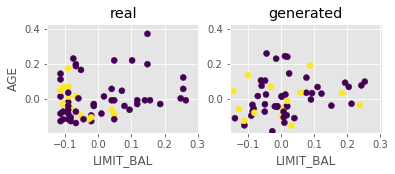

Step: 38400 of 50001.
Losses: G, D Gen, D Real: 0.2849, 0.4867, 0.5335
D Real - D Gen: 0.0468


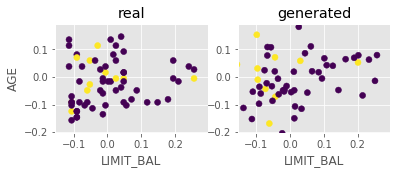

Step: 38500 of 50001.
Losses: G, D Gen, D Real: 0.6036, 0.5473, 0.6187
D Real - D Gen: 0.0714


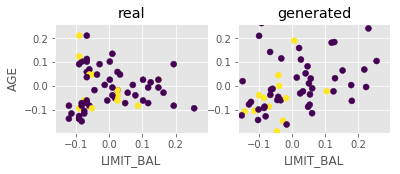

Step: 38600 of 50001.
Losses: G, D Gen, D Real: 0.4524, 0.5389, 0.5257
D Real - D Gen: -0.0131


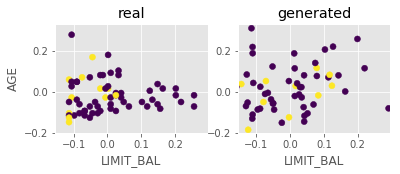

Step: 38700 of 50001.
Losses: G, D Gen, D Real: 0.4037, 0.5302, 0.5554
D Real - D Gen: 0.0252


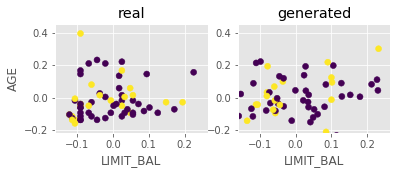

Step: 38800 of 50001.
Losses: G, D Gen, D Real: 0.3679, 0.5107, 0.4404
D Real - D Gen: -0.0703


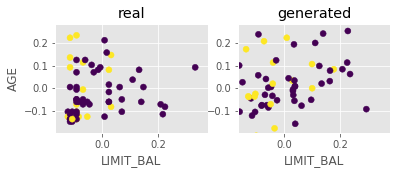

Step: 38900 of 50001.
Losses: G, D Gen, D Real: 0.2756, 0.4969, 0.4786
D Real - D Gen: -0.0183


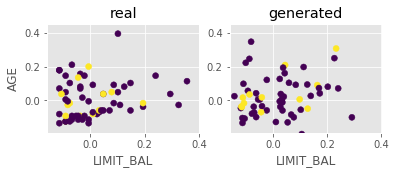

Step: 39000 of 50001.
Losses: G, D Gen, D Real: 0.5802, 0.5650, 0.6003
D Real - D Gen: 0.0354


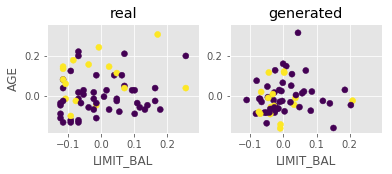

Step: 39100 of 50001.
Losses: G, D Gen, D Real: 0.3865, 0.5059, 0.5089
D Real - D Gen: 0.0030


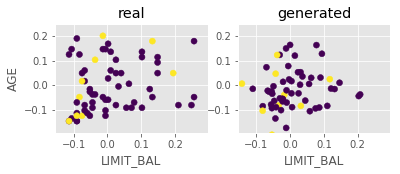

Step: 39200 of 50001.
Losses: G, D Gen, D Real: 0.4091, 0.5071, 0.5237
D Real - D Gen: 0.0166


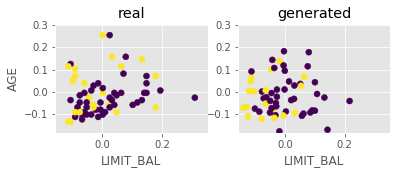

Step: 39300 of 50001.
Losses: G, D Gen, D Real: 0.3308, 0.5152, 0.5294
D Real - D Gen: 0.0142


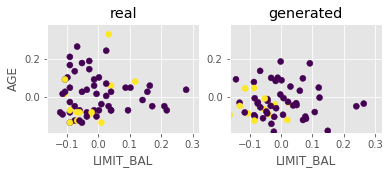

Step: 39400 of 50001.
Losses: G, D Gen, D Real: 0.9430, 0.6292, 0.6314
D Real - D Gen: 0.0022


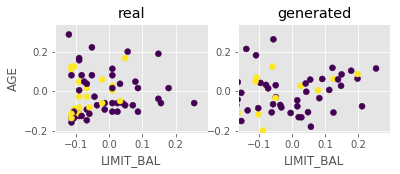

Step: 39500 of 50001.
Losses: G, D Gen, D Real: 0.5960, 0.5714, 0.6108
D Real - D Gen: 0.0394


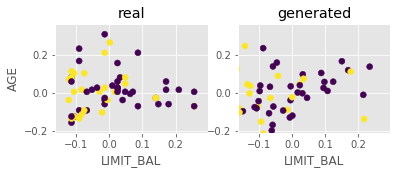

Step: 39600 of 50001.
Losses: G, D Gen, D Real: 0.3843, 0.5459, 0.5425
D Real - D Gen: -0.0034


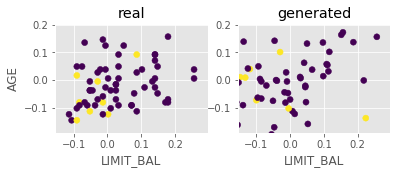

Step: 39700 of 50001.
Losses: G, D Gen, D Real: 0.3091, 0.5083, 0.5175
D Real - D Gen: 0.0092


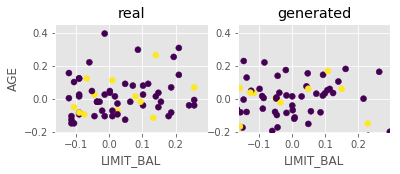

Step: 39800 of 50001.
Losses: G, D Gen, D Real: 0.3156, 0.5172, 0.5487
D Real - D Gen: 0.0315


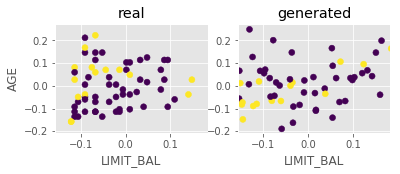

Step: 39900 of 50001.
Losses: G, D Gen, D Real: 0.6232, 0.5852, 0.5596
D Real - D Gen: -0.0255


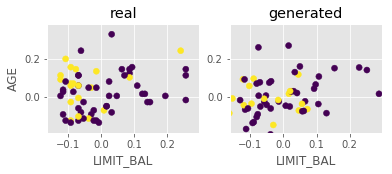

Step: 40000 of 50001.
Losses: G, D Gen, D Real: 0.4291, 0.5172, 0.5134
D Real - D Gen: -0.0039


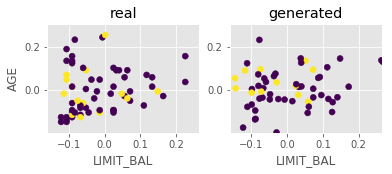

Step: 40100 of 50001.
Losses: G, D Gen, D Real: 0.3842, 0.5015, 0.4673
D Real - D Gen: -0.0342


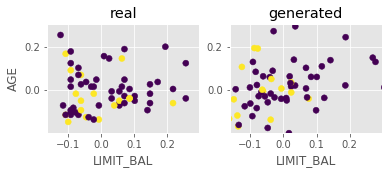

Step: 40200 of 50001.
Losses: G, D Gen, D Real: 0.3114, 0.4724, 0.4762
D Real - D Gen: 0.0038


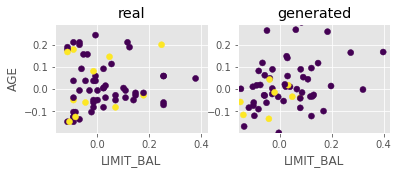

Step: 40300 of 50001.
Losses: G, D Gen, D Real: 0.2403, 0.4720, 0.4704
D Real - D Gen: -0.0015


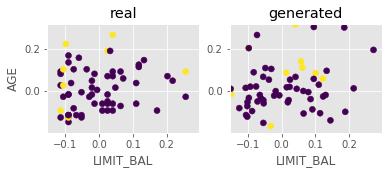

Step: 40400 of 50001.
Losses: G, D Gen, D Real: 0.4780, 0.5466, 0.5679
D Real - D Gen: 0.0212


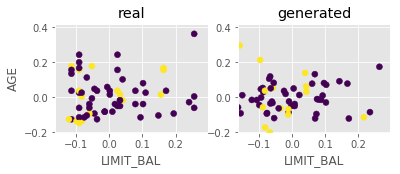

Step: 40500 of 50001.
Losses: G, D Gen, D Real: 0.3691, 0.5240, 0.5467
D Real - D Gen: 0.0228


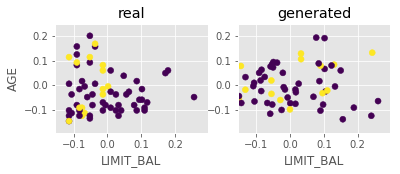

Step: 40600 of 50001.
Losses: G, D Gen, D Real: 0.3023, 0.4817, 0.6064
D Real - D Gen: 0.1247


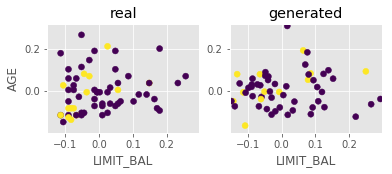

Step: 40700 of 50001.
Losses: G, D Gen, D Real: 0.2627, 0.5258, 0.5577
D Real - D Gen: 0.0320


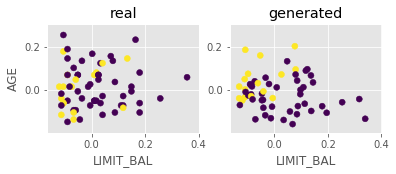

Step: 40800 of 50001.
Losses: G, D Gen, D Real: 0.6842, 0.5182, 0.5048
D Real - D Gen: -0.0133


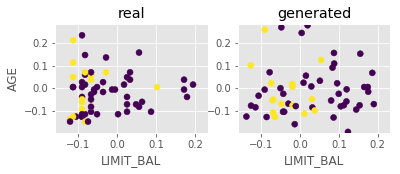

Step: 40900 of 50001.
Losses: G, D Gen, D Real: 0.3775, 0.5411, 0.4360
D Real - D Gen: -0.1050


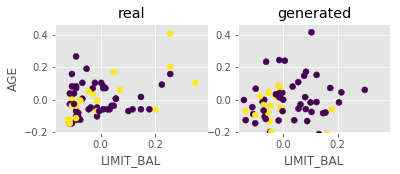

Step: 41000 of 50001.
Losses: G, D Gen, D Real: 0.3215, 0.5480, 0.4854
D Real - D Gen: -0.0626


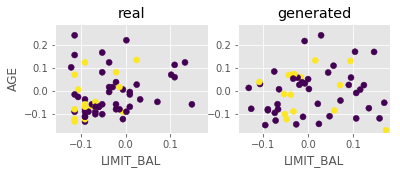

Step: 41100 of 50001.
Losses: G, D Gen, D Real: 0.2311, 0.5221, 0.4677
D Real - D Gen: -0.0544


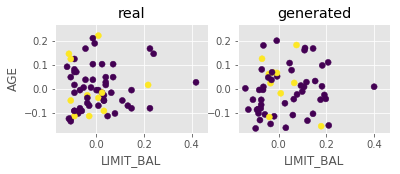

Step: 41200 of 50001.
Losses: G, D Gen, D Real: 0.2507, 0.5004, 0.5411
D Real - D Gen: 0.0406


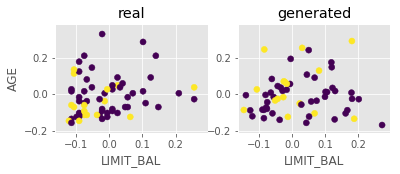

Step: 41300 of 50001.
Losses: G, D Gen, D Real: 0.6579, 0.5200, 0.5561
D Real - D Gen: 0.0360


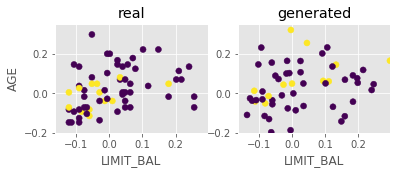

Step: 41400 of 50001.
Losses: G, D Gen, D Real: 0.4828, 0.5646, 0.4784
D Real - D Gen: -0.0862


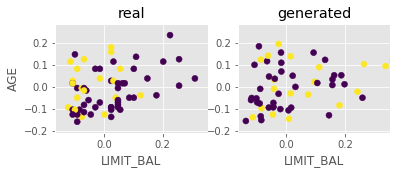

Step: 41500 of 50001.
Losses: G, D Gen, D Real: 0.3717, 0.4883, 0.4872
D Real - D Gen: -0.0011


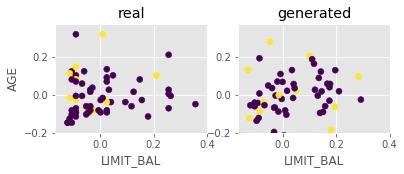

Step: 41600 of 50001.
Losses: G, D Gen, D Real: 0.3398, 0.5035, 0.5642
D Real - D Gen: 0.0608


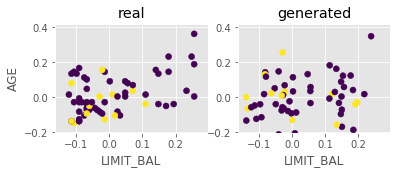

Step: 41700 of 50001.
Losses: G, D Gen, D Real: 0.2964, 0.4926, 0.4693
D Real - D Gen: -0.0233


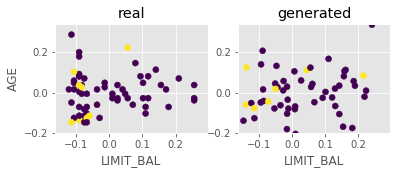

Step: 41800 of 50001.
Losses: G, D Gen, D Real: 0.5910, 0.5141, 0.5240
D Real - D Gen: 0.0099


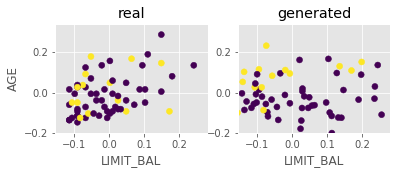

Step: 41900 of 50001.
Losses: G, D Gen, D Real: 0.3955, 0.4705, 0.4701
D Real - D Gen: -0.0004


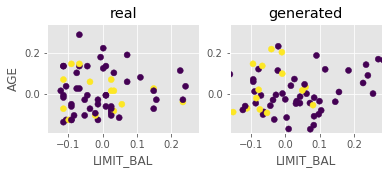

Step: 42000 of 50001.
Losses: G, D Gen, D Real: 0.3542, 0.5185, 0.4922
D Real - D Gen: -0.0263


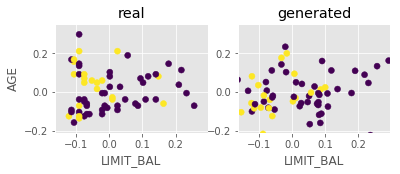

Step: 42100 of 50001.
Losses: G, D Gen, D Real: 0.2666, 0.4495, 0.5863
D Real - D Gen: 0.1368


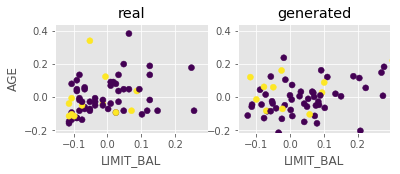

Step: 42200 of 50001.
Losses: G, D Gen, D Real: 0.9811, 0.7527, 0.5522
D Real - D Gen: -0.2005


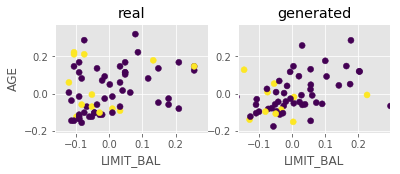

Step: 42300 of 50001.
Losses: G, D Gen, D Real: 0.4669, 0.5861, 0.5074
D Real - D Gen: -0.0787


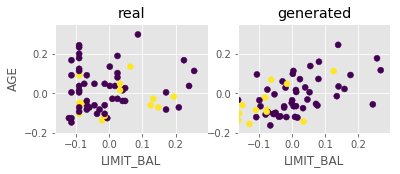

Step: 42400 of 50001.
Losses: G, D Gen, D Real: 0.4110, 0.5674, 0.6373
D Real - D Gen: 0.0699


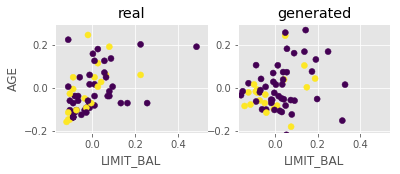

Step: 42500 of 50001.
Losses: G, D Gen, D Real: 0.3323, 0.6094, 0.5931
D Real - D Gen: -0.0163


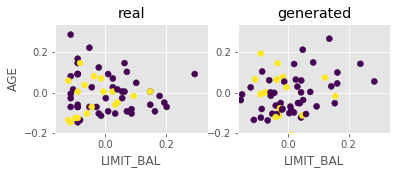

Step: 42600 of 50001.
Losses: G, D Gen, D Real: 0.2847, 0.5579, 0.6490
D Real - D Gen: 0.0911


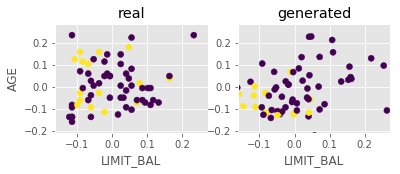

Step: 42700 of 50001.
Losses: G, D Gen, D Real: 0.6994, 0.5050, 0.5122
D Real - D Gen: 0.0072


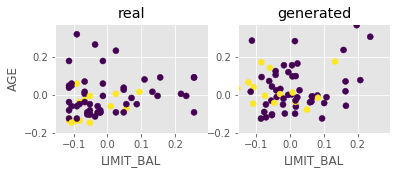

Step: 42800 of 50001.
Losses: G, D Gen, D Real: 0.4393, 0.5092, 0.5709
D Real - D Gen: 0.0617


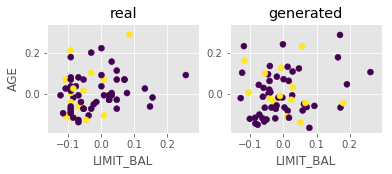

Step: 42900 of 50001.
Losses: G, D Gen, D Real: 0.3598, 0.4951, 0.5049
D Real - D Gen: 0.0098


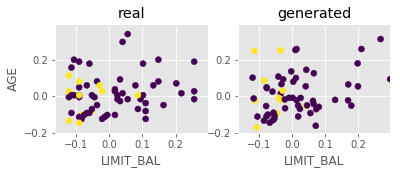

Step: 43000 of 50001.
Losses: G, D Gen, D Real: 0.3103, 0.5028, 0.5233
D Real - D Gen: 0.0205


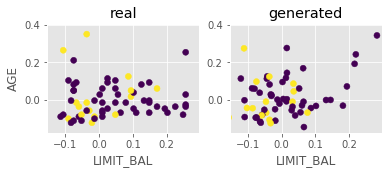

Step: 43100 of 50001.
Losses: G, D Gen, D Real: 0.2523, 0.4965, 0.6731
D Real - D Gen: 0.1766


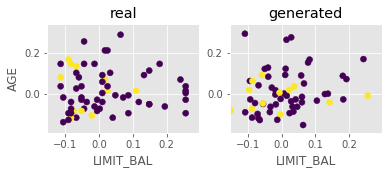

Step: 43200 of 50001.
Losses: G, D Gen, D Real: 0.5675, 0.4998, 0.4959
D Real - D Gen: -0.0039


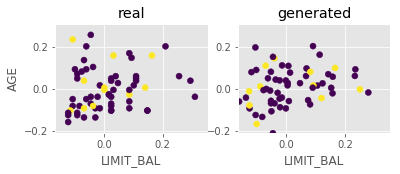

Step: 43300 of 50001.
Losses: G, D Gen, D Real: 0.3899, 0.5188, 0.4881
D Real - D Gen: -0.0306


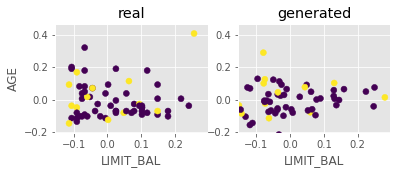

Step: 43400 of 50001.
Losses: G, D Gen, D Real: 0.3154, 0.4607, 0.4552
D Real - D Gen: -0.0055


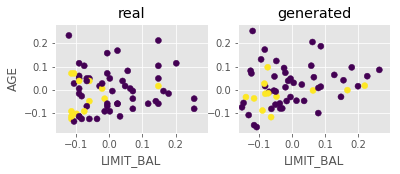

Step: 43500 of 50001.
Losses: G, D Gen, D Real: 0.2621, 0.4487, 0.5240
D Real - D Gen: 0.0753


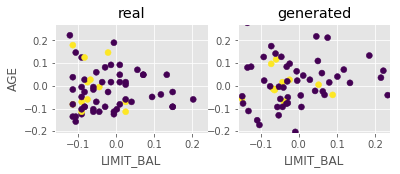

Step: 43600 of 50001.
Losses: G, D Gen, D Real: 1.0618, 0.7220, 0.4980
D Real - D Gen: -0.2240


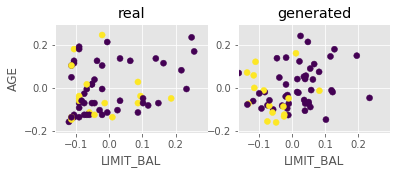

Step: 43700 of 50001.
Losses: G, D Gen, D Real: 0.5062, 0.5086, 0.6439
D Real - D Gen: 0.1353


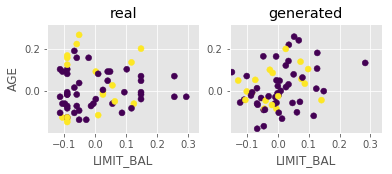

Step: 43800 of 50001.
Losses: G, D Gen, D Real: 0.3485, 0.4719, 0.4036
D Real - D Gen: -0.0683


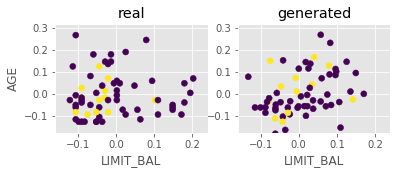

Step: 43900 of 50001.
Losses: G, D Gen, D Real: 0.3353, 0.4751, 0.5003
D Real - D Gen: 0.0252


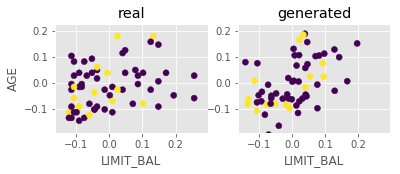

Step: 44000 of 50001.
Losses: G, D Gen, D Real: 0.3076, 0.4632, 0.4460
D Real - D Gen: -0.0172


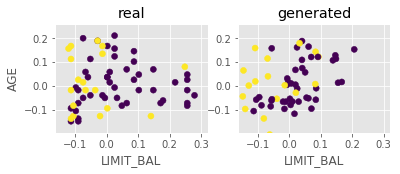

Step: 44100 of 50001.
Losses: G, D Gen, D Real: 0.6868, 0.5691, 0.5250
D Real - D Gen: -0.0441


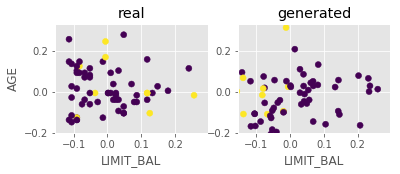

Step: 44200 of 50001.
Losses: G, D Gen, D Real: 0.4365, 0.5225, 0.5182
D Real - D Gen: -0.0042


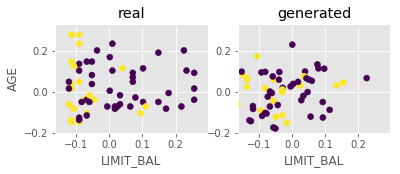

Step: 44300 of 50001.
Losses: G, D Gen, D Real: 0.3045, 0.4788, 0.4534
D Real - D Gen: -0.0254


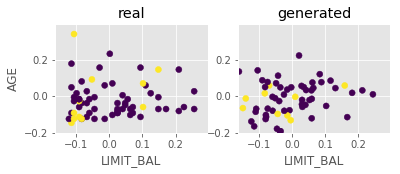

Step: 44400 of 50001.
Losses: G, D Gen, D Real: 0.2635, 0.4635, 0.4548
D Real - D Gen: -0.0086


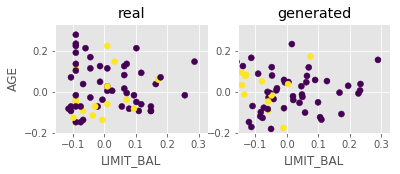

Step: 44500 of 50001.
Losses: G, D Gen, D Real: 0.2205, 0.4709, 0.5614
D Real - D Gen: 0.0905


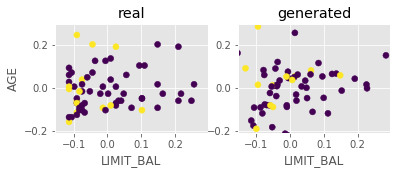

Step: 44600 of 50001.
Losses: G, D Gen, D Real: 0.5512, 0.5023, 0.4720
D Real - D Gen: -0.0303


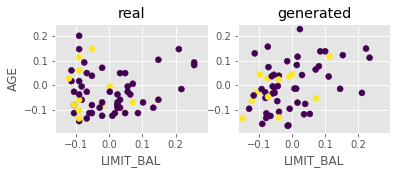

Step: 44700 of 50001.
Losses: G, D Gen, D Real: 0.3654, 0.4967, 0.5030
D Real - D Gen: 0.0063


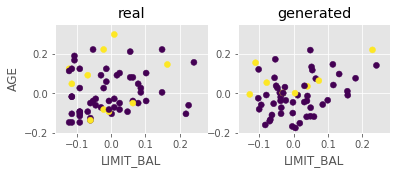

Step: 44800 of 50001.
Losses: G, D Gen, D Real: 0.3178, 0.5194, 0.4938
D Real - D Gen: -0.0257


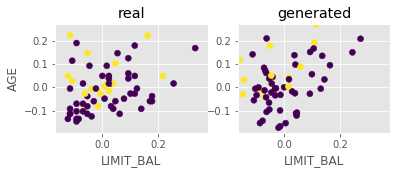

Step: 44900 of 50001.
Losses: G, D Gen, D Real: 0.2859, 0.4710, 0.3986
D Real - D Gen: -0.0723


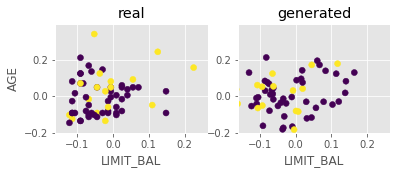

Step: 45000 of 50001.
Losses: G, D Gen, D Real: 1.1246, 0.4778, 0.4469
D Real - D Gen: -0.0310


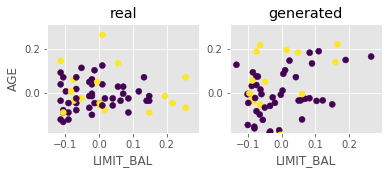

Step: 45100 of 50001.
Losses: G, D Gen, D Real: 0.4948, 0.5095, 0.4212
D Real - D Gen: -0.0883


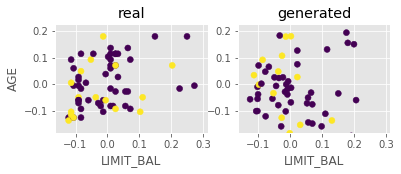

Step: 45200 of 50001.
Losses: G, D Gen, D Real: 0.3249, 0.4590, 0.4849
D Real - D Gen: 0.0260


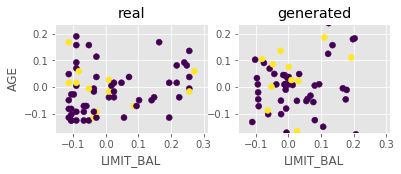

Step: 45300 of 50001.
Losses: G, D Gen, D Real: 0.2569, 0.4822, 0.4909
D Real - D Gen: 0.0087


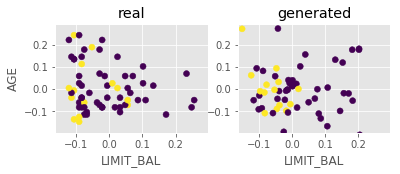

Step: 45400 of 50001.
Losses: G, D Gen, D Real: 0.2290, 0.4954, 0.4363
D Real - D Gen: -0.0592


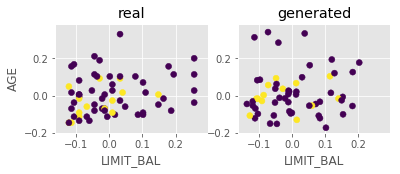

Step: 45500 of 50001.
Losses: G, D Gen, D Real: 1.0014, 0.5715, 0.5638
D Real - D Gen: -0.0077


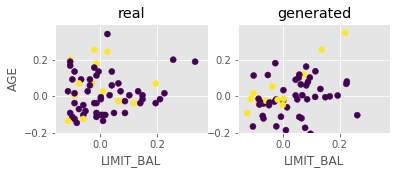

Step: 45600 of 50001.
Losses: G, D Gen, D Real: 0.4278, 0.5241, 0.5384
D Real - D Gen: 0.0143


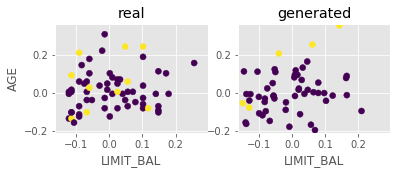

Step: 45700 of 50001.
Losses: G, D Gen, D Real: 0.3345, 0.4776, 0.4939
D Real - D Gen: 0.0163


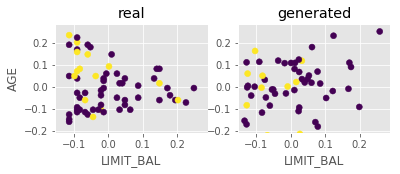

Step: 45800 of 50001.
Losses: G, D Gen, D Real: 0.2828, 0.4718, 0.4358
D Real - D Gen: -0.0361


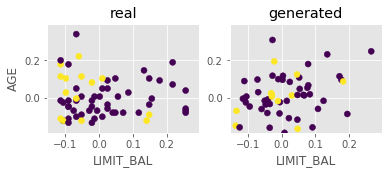

Step: 45900 of 50001.
Losses: G, D Gen, D Real: 0.2421, 0.4468, 0.4561
D Real - D Gen: 0.0093


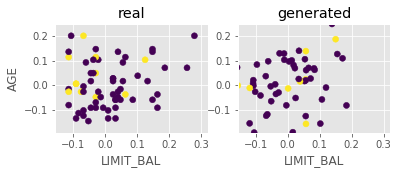

Step: 46000 of 50001.
Losses: G, D Gen, D Real: 0.5570, 0.5531, 0.7309
D Real - D Gen: 0.1778


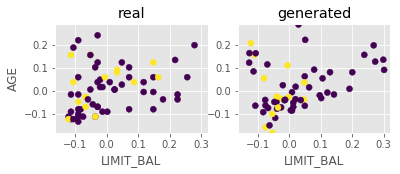

Step: 46100 of 50001.
Losses: G, D Gen, D Real: 0.3695, 0.4843, 0.5387
D Real - D Gen: 0.0544


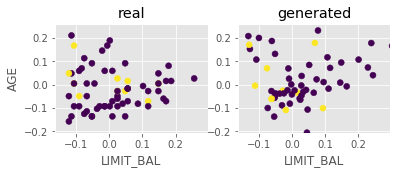

Step: 46200 of 50001.
Losses: G, D Gen, D Real: 0.3130, 0.5083, 0.5596
D Real - D Gen: 0.0513


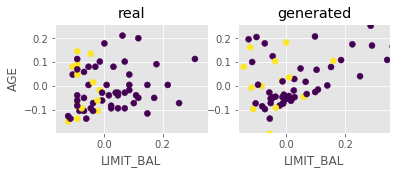

Step: 46300 of 50001.
Losses: G, D Gen, D Real: 0.2715, 0.5006, 0.6176
D Real - D Gen: 0.1170


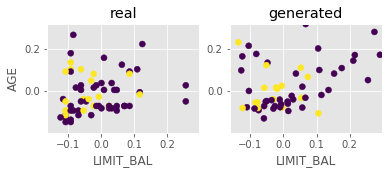

Step: 46400 of 50001.
Losses: G, D Gen, D Real: 0.2480, 0.5282, 0.5391
D Real - D Gen: 0.0109


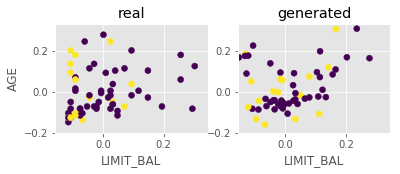

Step: 46500 of 50001.
Losses: G, D Gen, D Real: 0.4154, 0.5374, 0.5033
D Real - D Gen: -0.0341


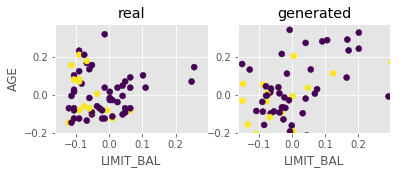

Step: 46600 of 50001.
Losses: G, D Gen, D Real: 0.3272, 0.4781, 0.5562
D Real - D Gen: 0.0781


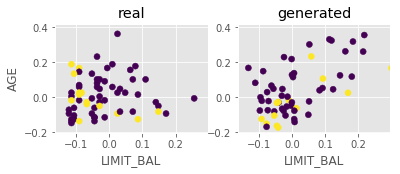

Step: 46700 of 50001.
Losses: G, D Gen, D Real: 0.2877, 0.4896, 0.4235
D Real - D Gen: -0.0661


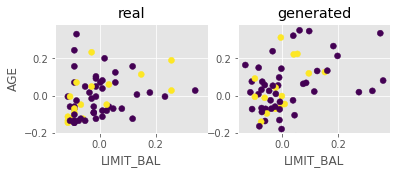

Step: 46800 of 50001.
Losses: G, D Gen, D Real: 0.2186, 0.4875, 0.4898
D Real - D Gen: 0.0023


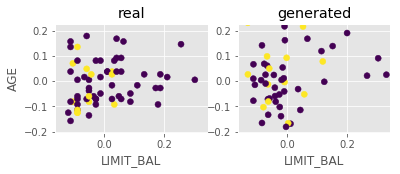

Step: 46900 of 50001.
Losses: G, D Gen, D Real: 0.8242, 0.7102, 0.5656
D Real - D Gen: -0.1445


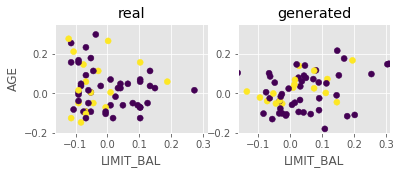

Step: 47000 of 50001.
Losses: G, D Gen, D Real: 0.4882, 0.5750, 0.5476
D Real - D Gen: -0.0274


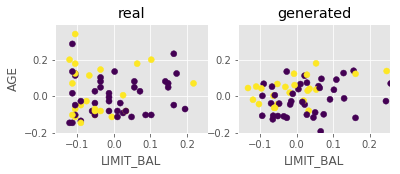

Step: 47100 of 50001.
Losses: G, D Gen, D Real: 0.3955, 0.5256, 0.4856
D Real - D Gen: -0.0399


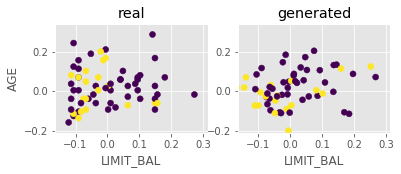

Step: 47200 of 50001.
Losses: G, D Gen, D Real: 0.3198, 0.4694, 0.6808
D Real - D Gen: 0.2114


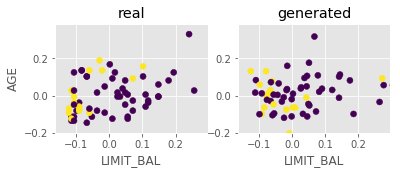

Step: 47300 of 50001.
Losses: G, D Gen, D Real: 0.1984, 0.4403, 0.4016
D Real - D Gen: -0.0387


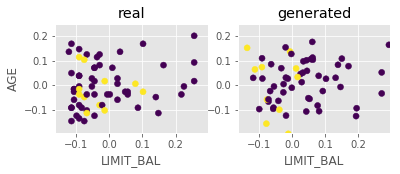

Step: 47400 of 50001.
Losses: G, D Gen, D Real: 0.6315, 0.5545, 0.5124
D Real - D Gen: -0.0421


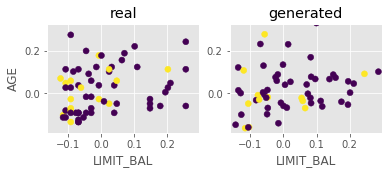

Step: 47500 of 50001.
Losses: G, D Gen, D Real: 0.4115, 0.5183, 0.5446
D Real - D Gen: 0.0263


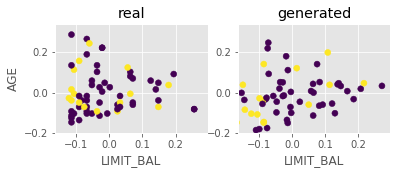

Step: 47600 of 50001.
Losses: G, D Gen, D Real: 0.2778, 0.4940, 0.5848
D Real - D Gen: 0.0908


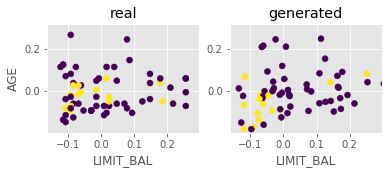

Step: 47700 of 50001.
Losses: G, D Gen, D Real: 0.2647, 0.4803, 0.5421
D Real - D Gen: 0.0619


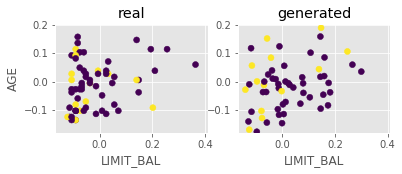

Step: 47800 of 50001.
Losses: G, D Gen, D Real: 0.2362, 0.4628, 0.4361
D Real - D Gen: -0.0268


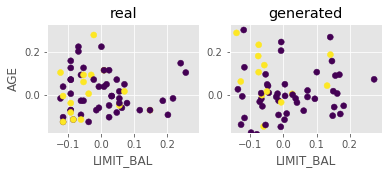

Step: 47900 of 50001.
Losses: G, D Gen, D Real: 0.5441, 0.5555, 0.5407
D Real - D Gen: -0.0148


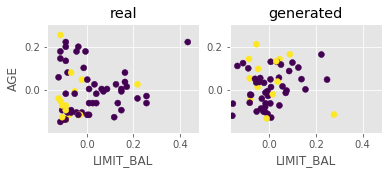

Step: 48000 of 50001.
Losses: G, D Gen, D Real: 0.3700, 0.5310, 0.4265
D Real - D Gen: -0.1045


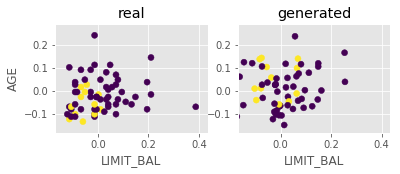

Step: 48100 of 50001.
Losses: G, D Gen, D Real: 0.2973, 0.5010, 0.4828
D Real - D Gen: -0.0181


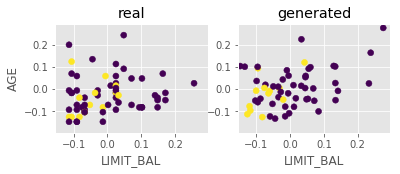

Step: 48200 of 50001.
Losses: G, D Gen, D Real: 0.2686, 0.5152, 0.4862
D Real - D Gen: -0.0290


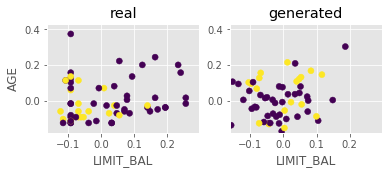

Step: 48300 of 50001.
Losses: G, D Gen, D Real: 0.7896, 0.6100, 0.5547
D Real - D Gen: -0.0553


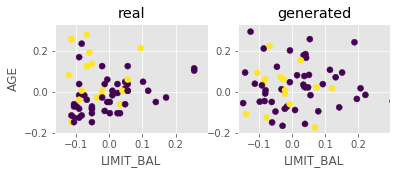

Step: 48400 of 50001.
Losses: G, D Gen, D Real: 0.4365, 0.5049, 0.5688
D Real - D Gen: 0.0639


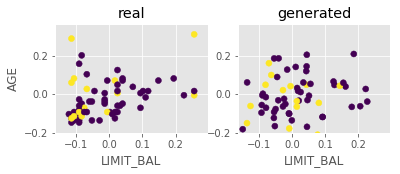

Step: 48500 of 50001.
Losses: G, D Gen, D Real: 0.3813, 0.4719, 0.5467
D Real - D Gen: 0.0748


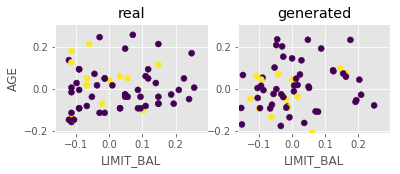

Step: 48600 of 50001.
Losses: G, D Gen, D Real: 0.3186, 0.4499, 0.6661
D Real - D Gen: 0.2162


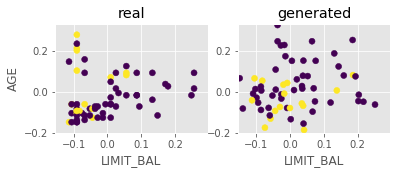

Step: 48700 of 50001.
Losses: G, D Gen, D Real: 0.2623, 0.4487, 0.5913
D Real - D Gen: 0.1426


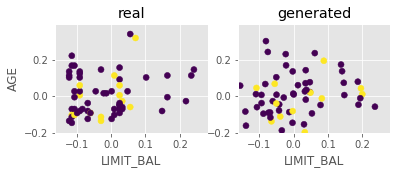

Step: 48800 of 50001.
Losses: G, D Gen, D Real: 0.6725, 0.5812, 0.6034
D Real - D Gen: 0.0222


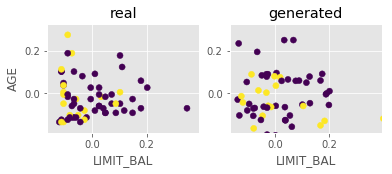

Step: 48900 of 50001.
Losses: G, D Gen, D Real: 0.4472, 0.5381, 0.5192
D Real - D Gen: -0.0188


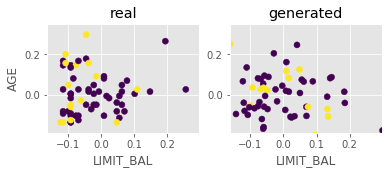

Step: 49000 of 50001.
Losses: G, D Gen, D Real: 0.3160, 0.5422, 0.5729
D Real - D Gen: 0.0307


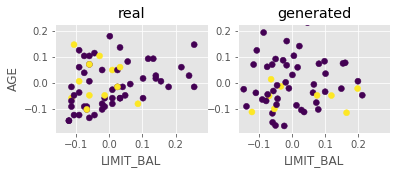

Step: 49100 of 50001.
Losses: G, D Gen, D Real: 0.3197, 0.5061, 0.4667
D Real - D Gen: -0.0395


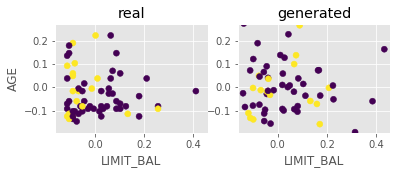

Step: 49200 of 50001.
Losses: G, D Gen, D Real: 0.2200, 0.4600, 0.4610
D Real - D Gen: 0.0010


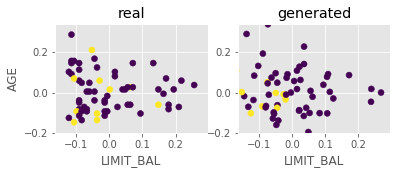

Step: 49300 of 50001.
Losses: G, D Gen, D Real: 0.5126, 0.5230, 0.6456
D Real - D Gen: 0.1226


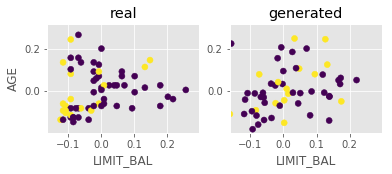

Step: 49400 of 50001.
Losses: G, D Gen, D Real: 0.4129, 0.4962, 0.4717
D Real - D Gen: -0.0245


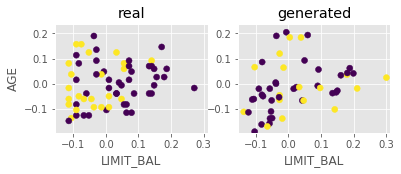

Step: 49500 of 50001.
Losses: G, D Gen, D Real: 0.2957, 0.4550, 0.4466
D Real - D Gen: -0.0085


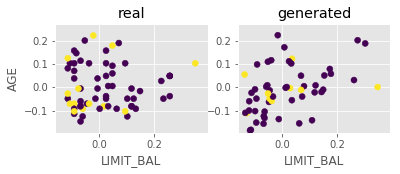

Step: 49600 of 50001.
Losses: G, D Gen, D Real: 0.2368, 0.4307, 0.4392
D Real - D Gen: 0.0085


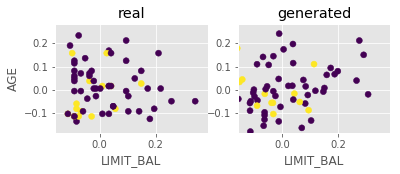

Step: 49700 of 50001.
Losses: G, D Gen, D Real: 0.9579, 0.9306, 0.5425
D Real - D Gen: -0.3881


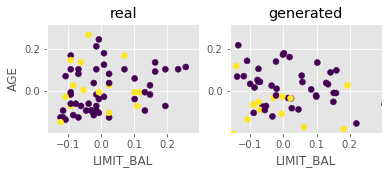

Step: 49800 of 50001.
Losses: G, D Gen, D Real: 0.5705, 0.5804, 0.4486
D Real - D Gen: -0.1319


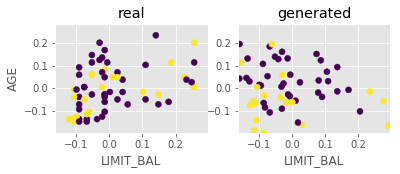

Step: 49900 of 50001.
Losses: G, D Gen, D Real: 0.3571, 0.5028, 0.4515
D Real - D Gen: -0.0513


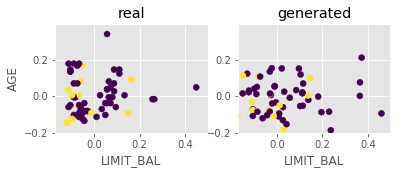

Step: 50000 of 50001.
Losses: G, D Gen, D Real: 0.3102, 0.4945, 0.6278
D Real - D Gen: 0.1333


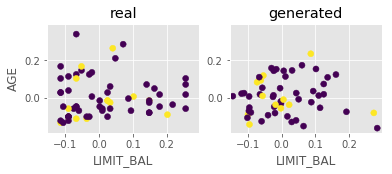

Wall time: 29min 24s


In [11]:
%%time

# Training the CGAN architecture

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-5 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

# Generated Data

In [12]:
# Let's look at some of the generated data
# First create the networks locally and load the weights

import CGAN
import importlib
importlib.reload(CGAN) # For reloading after making changes
from CGAN import *

rand_dim = 100 
base_n_count = 30 
seed = 17

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('./cache/credit/CGAN_generator_model_weights_step_50000.h5')


In [13]:
# Now generate some new data

test_size = 30000 

x = get_data_batch(train, test_size)
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = x[:,-label_dim:]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

In [14]:
real_samples = data
fake_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)

real_samples.to_excel('./data/credit/real.xlsx')
fake_samples.to_excel('./data/credit/fake.xlsx')

In [ ]:
real_samples = pd.read_excel('./data/credit/real.xlsx')
fake_samples = pd.read_excel('./data/credit/fake.xlsx')

# Correlation between variables of two datasets

## Pearson Correlation Index

In [15]:
real_samples.corrwith(fake_samples)


LIMIT_BAL                    -0.002485
AGE                          -0.009851
PAY_0                         0.000387
PAY_2                         0.001203
PAY_3                         0.000759
PAY_4                         0.001743
PAY_5                        -0.000607
PAY_6                         0.001859
BILL_AMT1                     0.001418
BILL_AMT2                    -0.000654
BILL_AMT3                    -0.001726
BILL_AMT4                     0.005390
BILL_AMT5                     0.003827
BILL_AMT6                     0.000164
PAY_AMT1                     -0.007795
PAY_AMT2                     -0.002810
PAY_AMT3                      0.002798
PAY_AMT4                     -0.011413
PAY_AMT5                      0.001009
PAY_AMT6                      0.004851
default payment next month    0.008343
dtype: float64

## Covariance

In [16]:
columnas = real_samples.columns.values
for col in columnas:
    print(col + ":       " +  str(np.cov(real_samples[col], fake_samples[col])[0][1]))
    

LIMIT_BAL:       -0.00039569887676326046
AGE:       -0.001106943139926357
PAY_0:       4.337234627068901e-05
PAY_2:       0.00012926802552031772
PAY_3:       0.00010034705893201855
PAY_4:       0.0001959767088774486
PAY_5:       -7.454540556512287e-05
PAY_6:       0.00023436262517033377
BILL_AMT1:       0.00015881993279516922
BILL_AMT2:       -7.543367281994438e-05
BILL_AMT3:       -0.00019972567799530916
BILL_AMT4:       0.0006206736827031719
BILL_AMT5:       0.00033525470224680617
BILL_AMT6:       1.6191958838670068e-05
PAY_AMT1:       -0.0012070331735931658
PAY_AMT2:       -0.0007611649110943711
PAY_AMT3:       0.0003201049244627438
PAY_AMT4:       -0.0012311491029627598
PAY_AMT5:       0.0003077012206351176
PAY_AMT6:       0.0006457280023461161
default payment next month:       0.0014372745758192203


## Spearman's Correlation

In [17]:
from scipy.stats import spearmanr
columnas = real_samples.columns.values
for col in columnas:
    spr, _ = spearmanr(real_samples[col], fake_samples[col])
    print(col + ":       " + str(spr) )

LIMIT_BAL:       -0.00657728791291954
AGE:       -0.016545005007000596
PAY_0:       0.0012171487213553877
PAY_2:       0.0031401516811385742
PAY_3:       -0.0008976570894120121
PAY_4:       0.0031877213426447447
PAY_5:       0.000704843461990257
PAY_6:       0.007323714940749889
BILL_AMT1:       0.002203482782992829
BILL_AMT2:       0.0014510519571494934
BILL_AMT3:       -3.2806738345483315e-05
BILL_AMT4:       0.0058408492755740666
BILL_AMT5:       0.005351555615580705
BILL_AMT6:       0.0014011025454350493
PAY_AMT1:       0.004876721174426342
PAY_AMT2:       -0.010867439575552515
PAY_AMT3:       0.009748625504429231
PAY_AMT4:       -0.0051170673554363265
PAY_AMT5:       0.0007365911431557947
PAY_AMT6:       0.002258436625495871
default payment next month:       0.008342845502253355


# XGBoost

## CV with real data

In [9]:
# Classification results with real data
xgbo_cv(data[data_cols], data[label_cols].values.ravel())

Accuracy XGBoost CV:  0.8204672201889043
F1-Score XGBoost CV:  0.4706653604503141
ROC AUC XGBoost CV:  0.7789121709622376


## CV with generated data

In [19]:
# Generated data
X = fake_samples.drop(columns=["default payment next month"])
y = fake_samples["default payment next month"]
xgbo_cv(X, y.values.ravel())

Accuracy XGBoost CV:  0.8519332983592584
F1-Score XGBoost CV:  0.6129047434438426
ROC AUC XGBoost CV:  0.8801670257584568


## CV with the two datasets joined

In [20]:
from sklearn.utils import shuffle
real_samples = data.copy()
data = pd.concat([real_samples, fake_samples])
data = shuffle(data)
data.to_excel('./data/credit/real_fake.xlsx')

In [21]:
xgbo_cv(data.drop(columns=['default payment next month']), data['default payment next month'].values.ravel())

Accuracy XGBoost CV:  0.8304665407208326
F1-Score XGBoost CV:  0.5120792113676262
ROC AUC XGBoost CV:  0.8258075947835696
